In [1]:
import pymc3 as pm
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import seaborn as sns

from scipy.interpolate import griddata
from patsy import dmatrix

In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use('arviz-darkgrid')

In [3]:
import sys, IPython, scipy, matplotlib, pandas, seaborn, patsy, platform
print("""This notebook was created using:\nPython {}\nIPython {}\nPyMC3 {}\nArviZ {}\nNumPy {}\nSciPy {}\nPandas {}\nSeaborn {}\nPatsy {}\nMatplotlib {}\n""".format(sys.version[:5], IPython.__version__, pm.__version__, az.__version__, np.__version__, scipy.__version__, pandas.__version__, seaborn.__version__, patsy.__version__, matplotlib.__version__))

This notebook was created using:
Python 3.7.4
IPython 7.13.0
PyMC3 3.8
ArviZ 0.7.0
NumPy 1.18.2
SciPy 1.4.1
Pandas 1.0.3
Seaborn 0.10.0
Patsy 0.5.1
Matplotlib 3.2.1



# Chapter 4  Geocentric Models

## 4.1. Why normal distributions are normal

### 4.1.1. Normal by addition

### Code 4.1

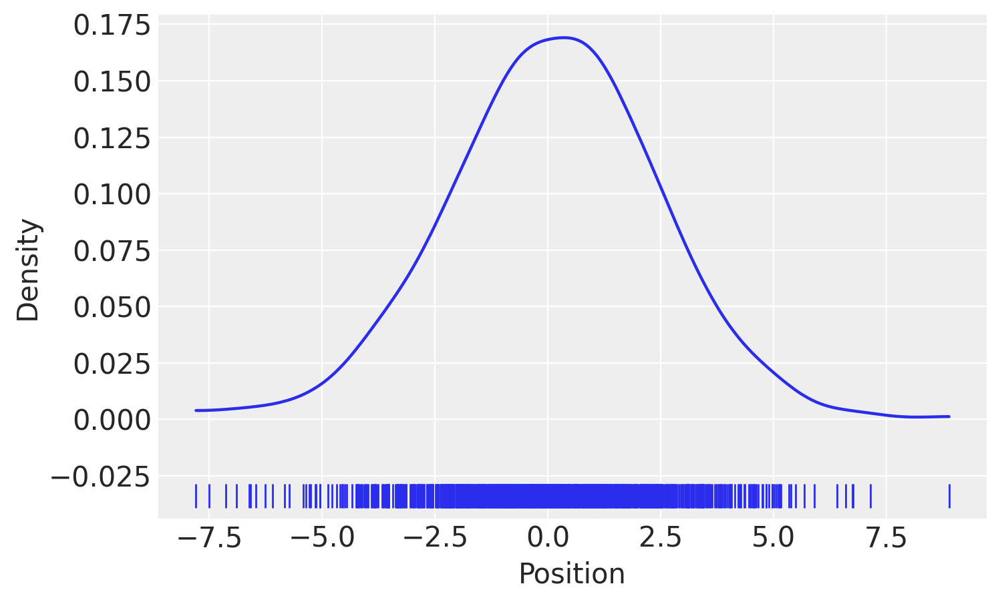

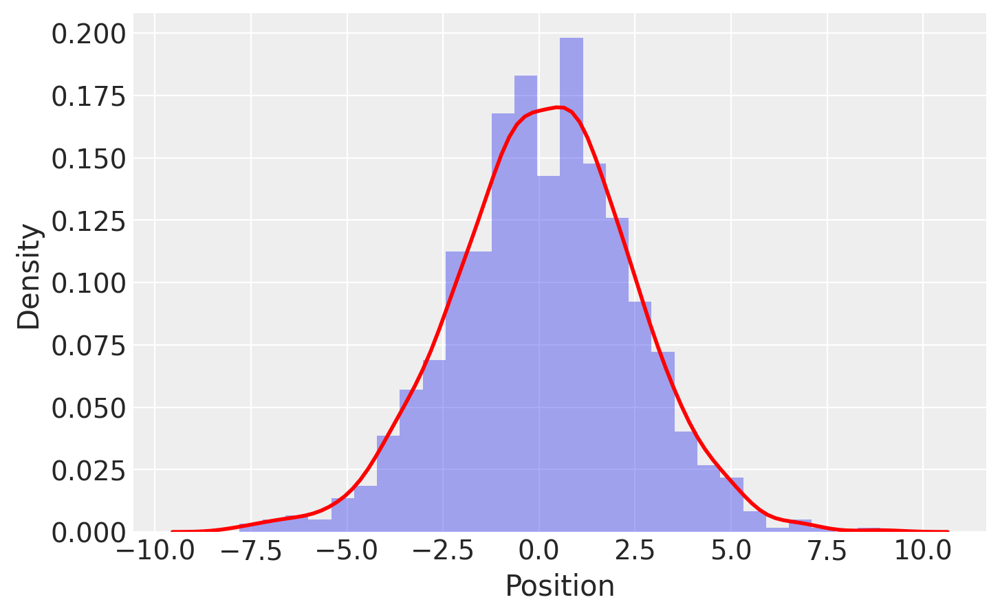

In [4]:
# generate for a list of 16 random numbers between −1 and 1
# replicate this procedure 1000 times
pos = np.random.uniform(-1, 1, size=(16, 1000)).sum(0)
# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(pos, rug=True)
plt.xlabel('Position', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(pos, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Position', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### 4.1.2. Normal by multiplication

### Code 4.2

In [5]:
# the product of all 12 randomly generated numbers between 1.0 and 1.1
np.random.uniform(1, 1.1, size=12).prod()

1.5885162874565348

### Code 4.3

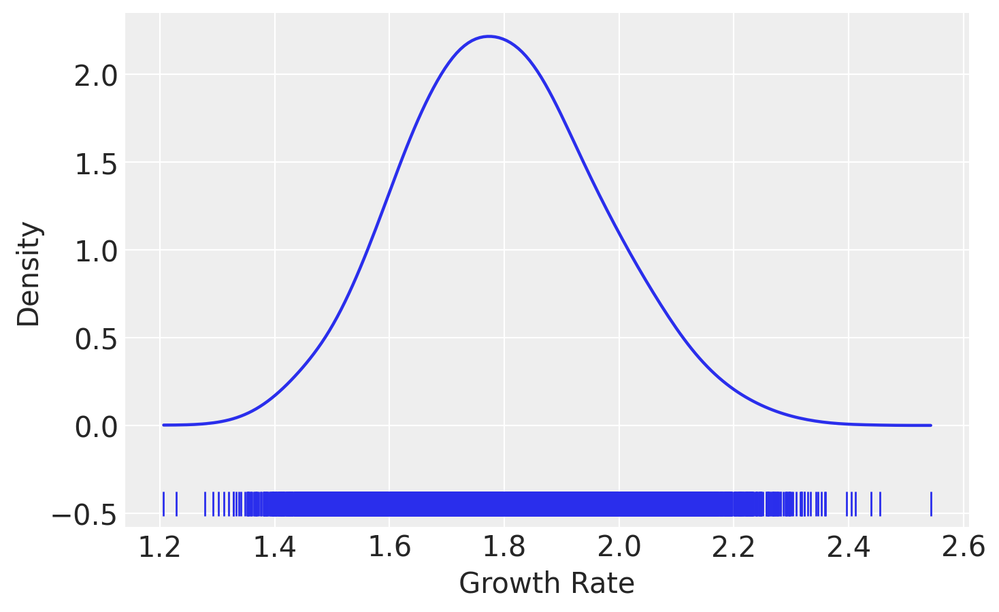

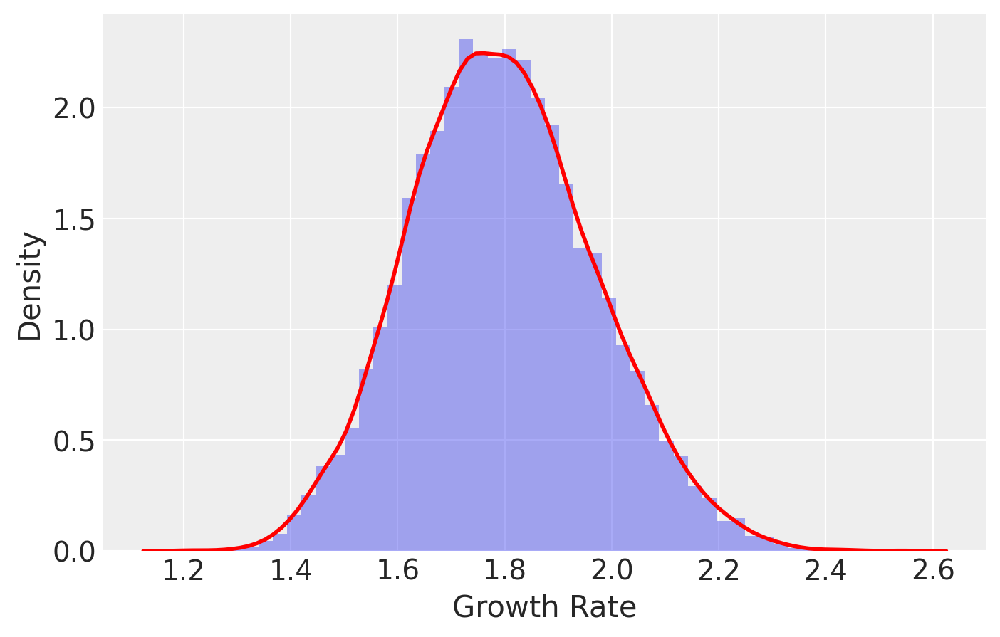

In [6]:
# generate 10,000 of the product of all 12 randomly generated numbers between 1.0 and 1.1
growth = np.random.uniform(1, 1.1, size=(12, 10000)).prod(0)

# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(growth, rug=True)
plt.xlabel('Growth Rate', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(growth, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Growth Rate', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.4


In [7]:
# small effects that multiply together are approximately additive
big = np.random.uniform(1, 1.5, size=(12, 10000)).prod(0)
small = np.random.uniform(1, 1.01, size=(12, 10000)).prod(0)

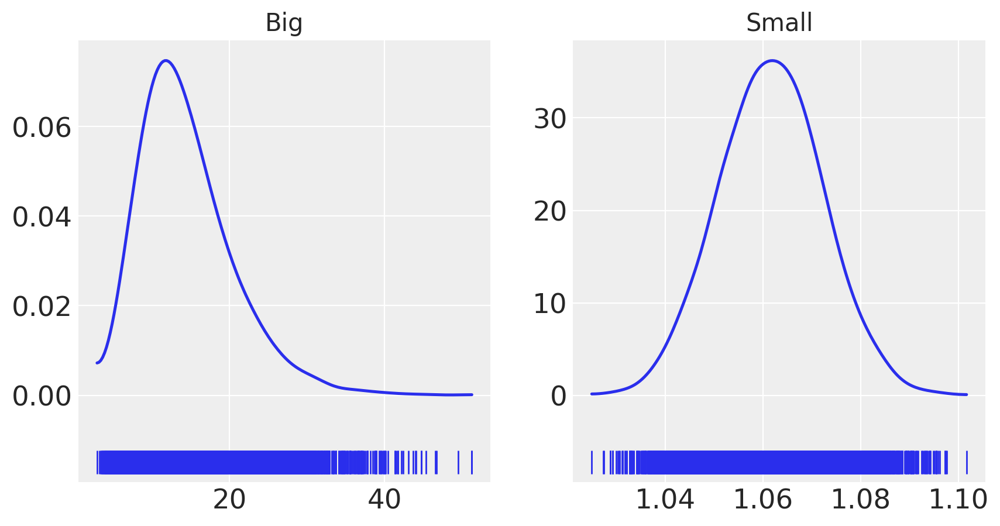

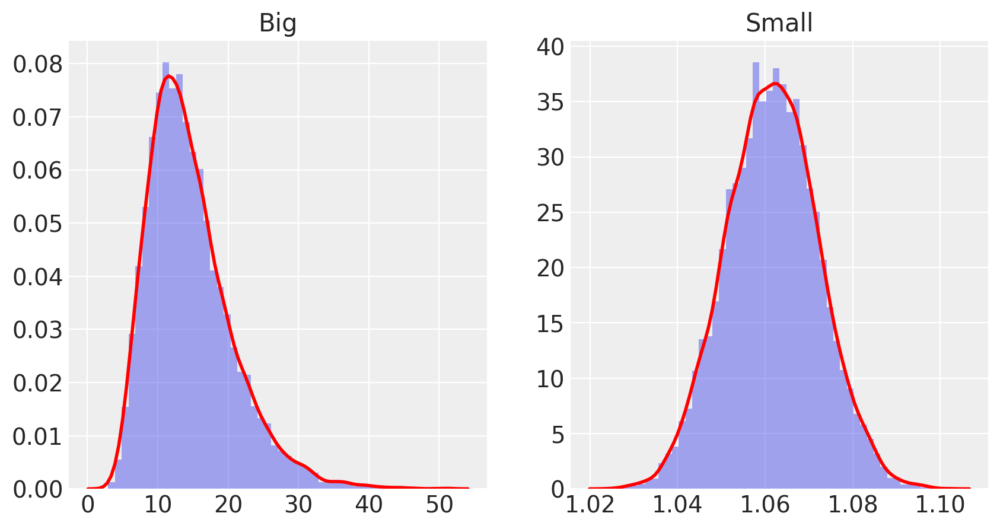

In [8]:
# plot figure
_, ax = plt.subplots(1, 2, figsize=(10, 5))
az.plot_kde(big, ax=ax[0], rug=True)
az.plot_kde(small, ax=ax[1], rug=True)
ax[0].set_title('Big', fontsize=15)
ax[1].set_title('Small', fontsize=15)
plt.show()

# plot figure
_, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.distplot(big, ax=ax[0], hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
sns.distplot(small, ax=ax[1], hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
ax[0].set_title('Big', fontsize=15)
ax[1].set_title('Small', fontsize=15)
plt.show()

### 4.1.3. Normal by log-multiplication

### Code 4.5

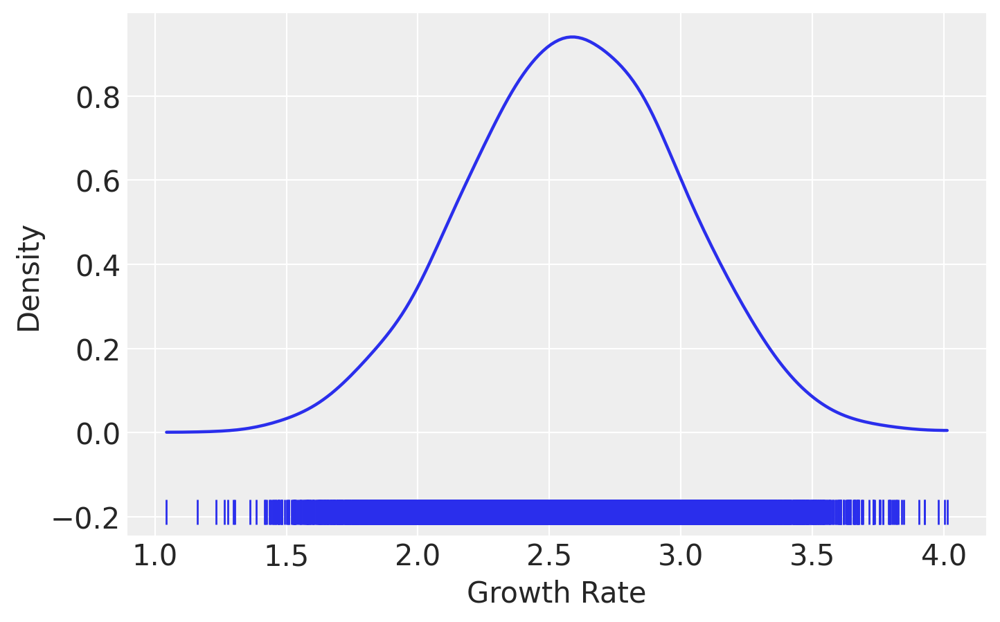

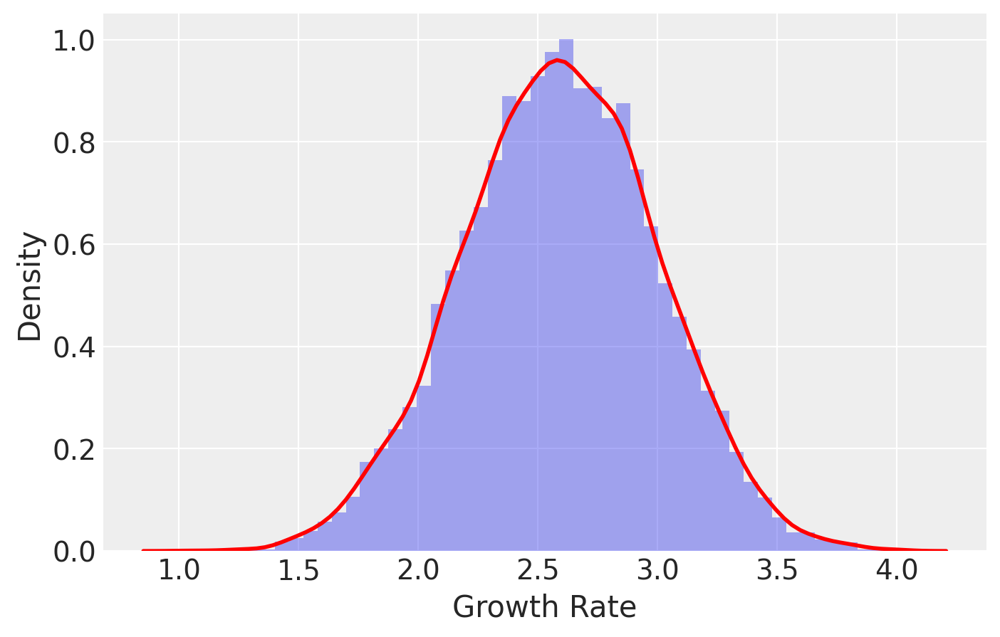

In [9]:
# large deviates that are multiplied together 
# tend to produce Gaussian distributions on the log scale
log_big = np.log(np.random.uniform(1, 1.5, size=(12, 10000)).prod(0))

# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(log_big, rug=True)
plt.xlabel('Growth Rate', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(log_big, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Growth Rate', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### 4.1.4. Using Gaussian distributions

Probability distributions with only discrete outcomes, like the binomial, are called probability mass functions and denoted $Pr.$ Continuous ones like the Gaussian are called probability density functions, denoted with $p$ or just plain old $f$, depending upon author and tradition. For mathematical reasons, probability densities, but not masses, can be greater than 1. Probability density is the rate of change in cumulative probability. So where cumulative probability is increasing rapidly, density can easily exceed 1. But if we calculate the area under the density function, it will never exceed 1. Such areas are also called probability mass.

## 4.2. Alanguage for describing models

### 4.2.1. Re-describing the globe tossing model

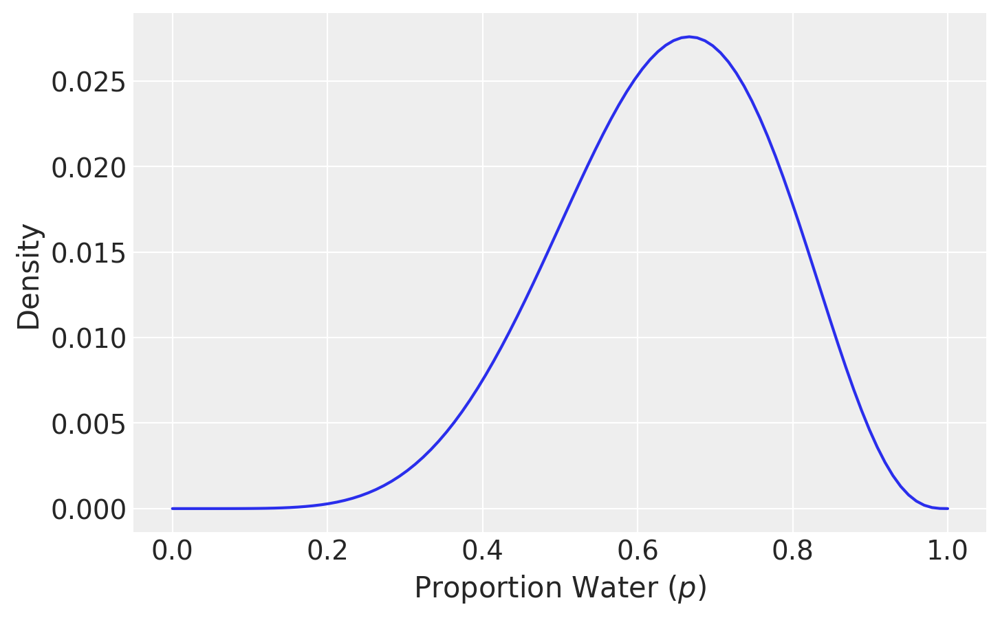

In [10]:
# from model definition to Bayes’ theorem
W = 6
N = 9
p_grid = np.linspace(0, 1, 100)
posterior = stats.binom.pmf(k=W, n=N, p=p_grid) * stats.uniform.pdf(p_grid, 0, 1)
posterior = posterior / (posterior).sum()

# plot figure
fig = plt.figure(figsize=(8, 5))
plt.plot(p_grid, posterior)
plt.xlabel('Proportion Water ($p$)', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

## 4.3. Gaussian model of height

### 4.3.1. The data

### Code 4.7 and 4.8

In [11]:
# partial census data by Nancy Howell
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


### Code 4.9

In [12]:
# summary of the dataset
func_dict = {"mean": np.mean,
             "std": np.std,
             "median": lambda x: np.percentile(x, 50),
             "5%": lambda x: np.percentile(x, 5),
             "95%": lambda x: np.percentile(x, 95)
            }
az.summary(d.to_dict(orient="list"), stat_funcs=func_dict, extend=False, kind="stats")

,mean,std,median,5%,95%
height,138.264,27.577,148.590,77.026,165.735
weight,35.611,14.706,40.058,9.165,54.818
age,29.344,20.728,27.000,1.000,67.000
male,0.472,0.499,0.000,0.000,1.000


### Code 4.10

In [13]:
d.height

0      151.765
1      139.700
2      136.525
3      156.845
4      145.415
        ...   
539    145.415
540    162.560
541    156.210
542     71.120
543    158.750
Name: height, Length: 544, dtype: float64

### Code 4.11

In [14]:
# filter out people < 18
d2 = d[d.age>=18]
d2.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


### 4.3.2. The model

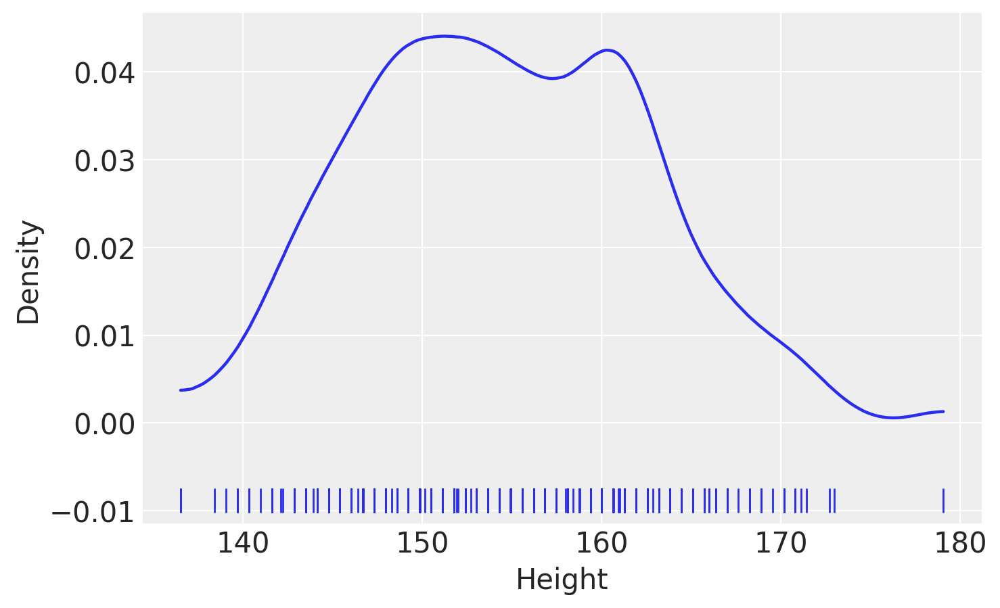

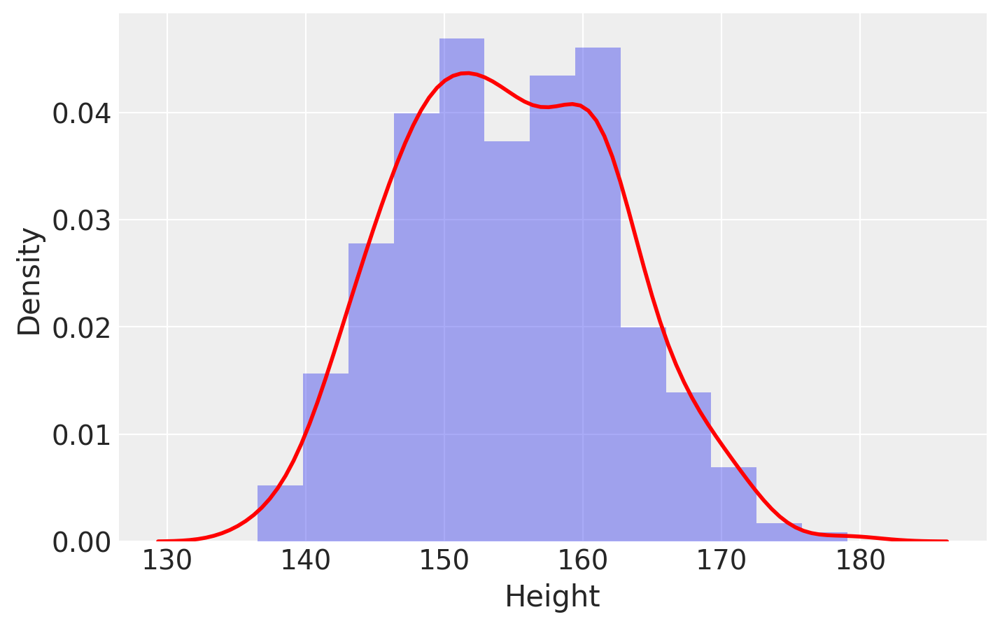

In [15]:
# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(d2.height, rug=True)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(d2.height, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

independent and identically distributed: iid indicates that each value $h_i$ has the same probability function, independent of the other $h$ values and using the same parameters.

### Code 4.12

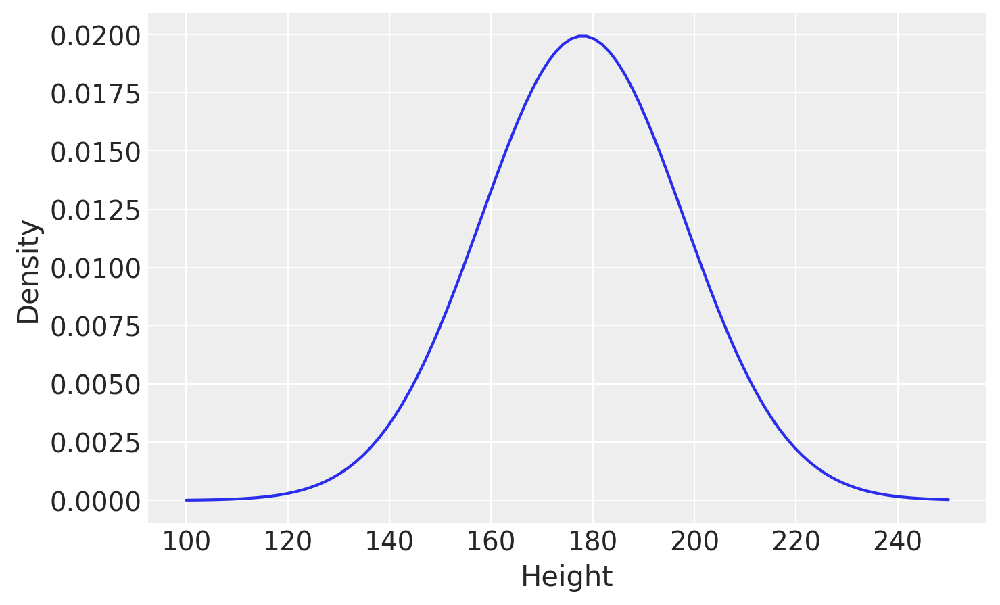

In [16]:
# prior of μ
x = np.linspace(100, 250, 100)
y = stats.norm.pdf(x, 178, 20)

# plot figure
fig = plt.figure(figsize=(8, 5))
plt.plot(x, y)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.13

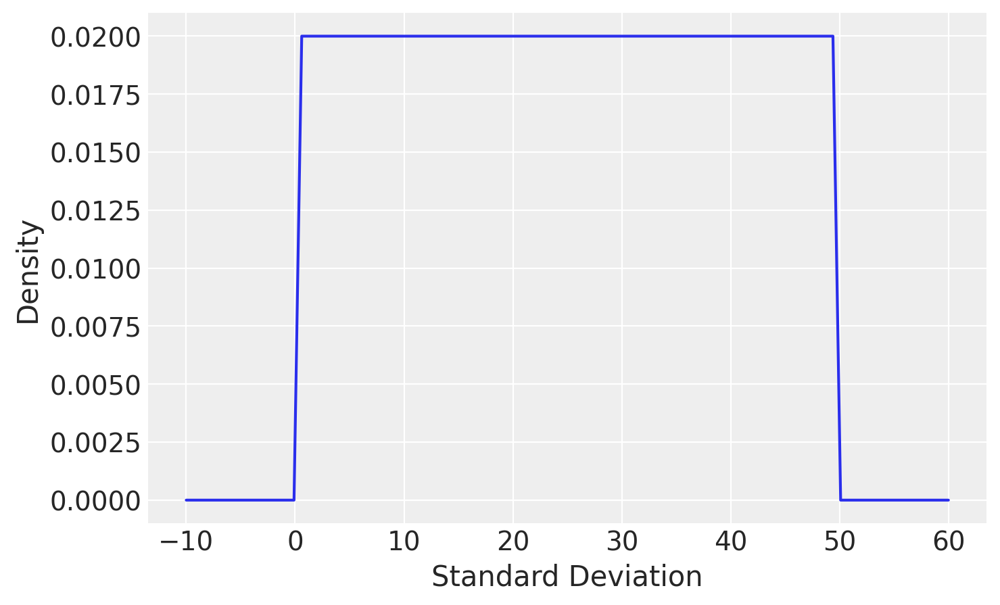

In [17]:
# prior of σ
x = np.linspace(-10, 60, 100)
y = stats.uniform.pdf(x, 0, 50)

# plot figure
fig = plt.figure(figsize=(8, 5))
plt.plot(x, y)
plt.xlabel('Standard Deviation', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.14

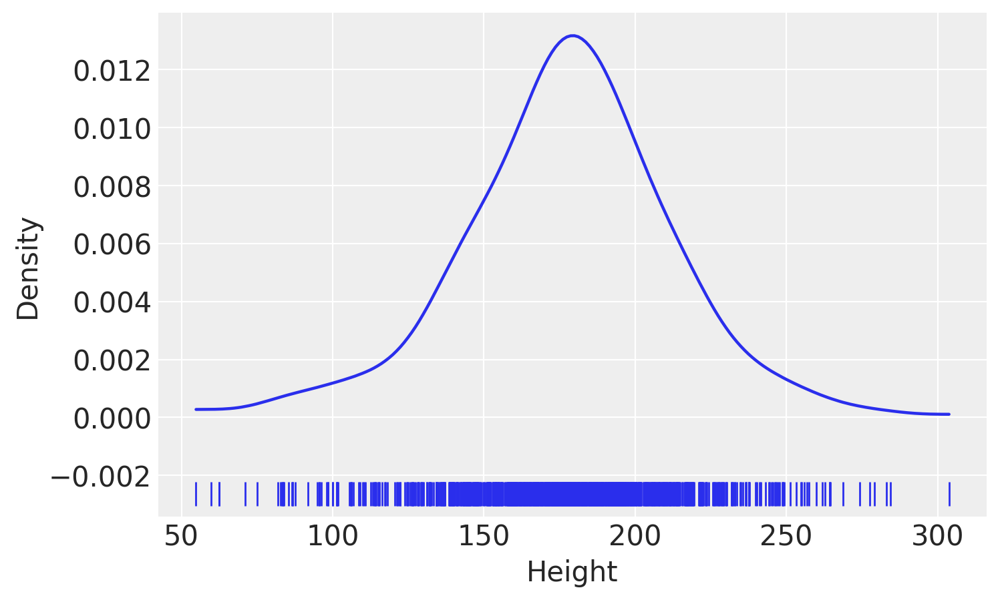

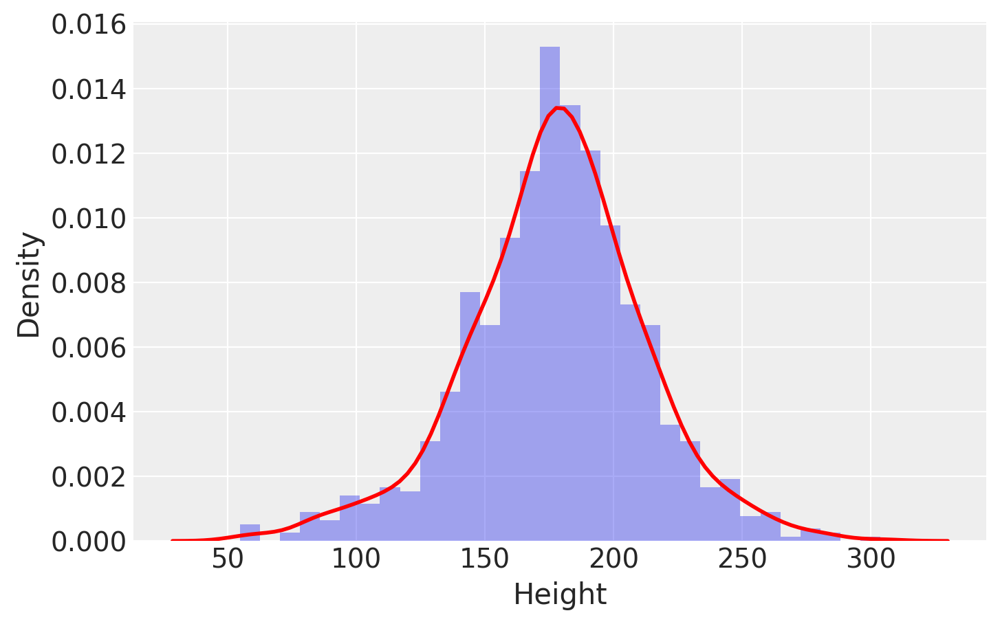

In [18]:
# sampling from the prior
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=20, size=n_samples)
sample_sigma = stats.uniform.rvs(loc=0, scale=50, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma, size=n_samples)

# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(prior_h, rug=True)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(prior_h, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.15

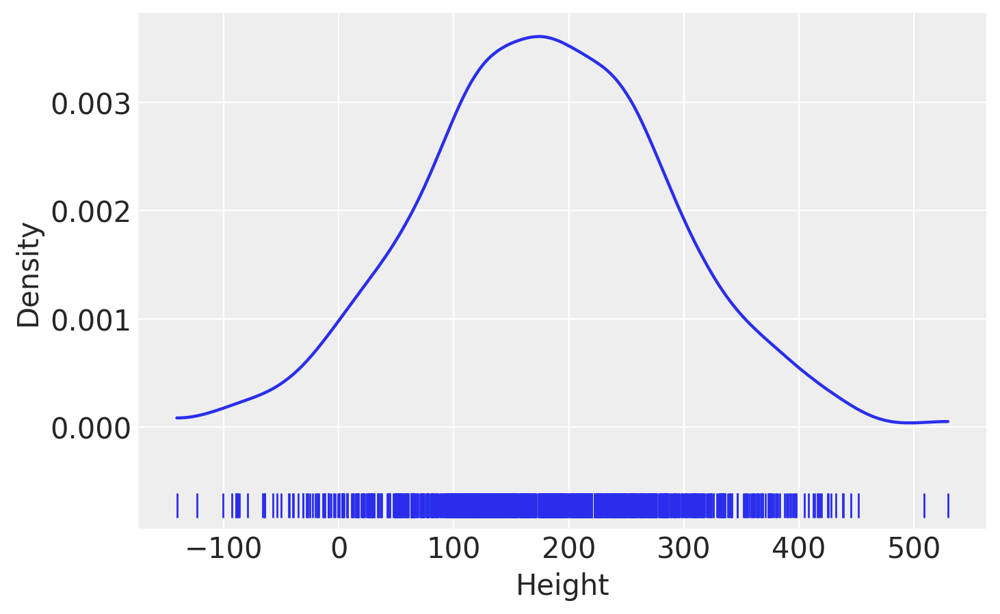

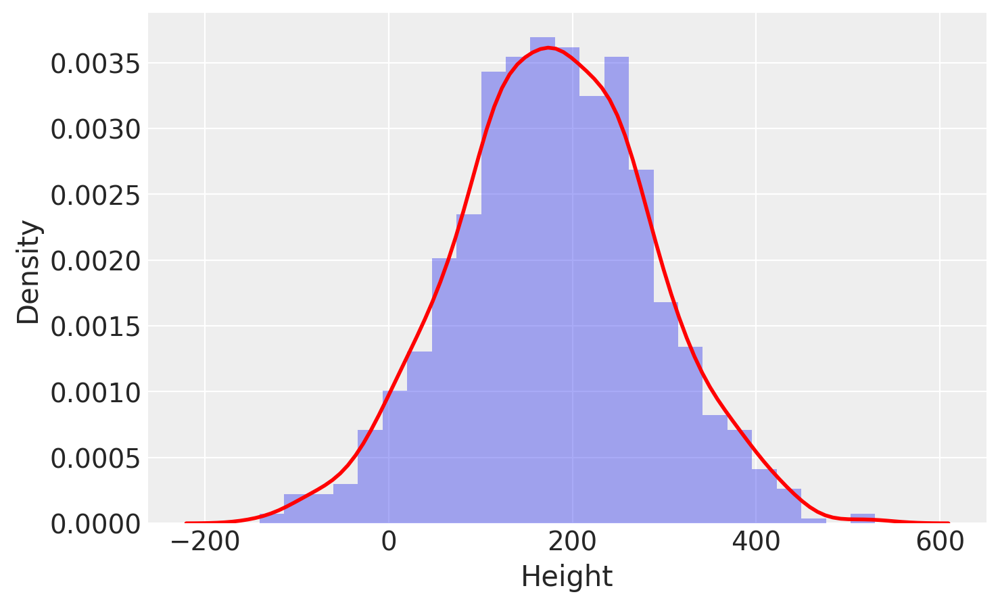

In [19]:
# sampling from the prior
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=100, size=n_samples)
sample_sigma = stats.uniform.rvs(loc=0, scale=50, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma, size=n_samples)

# plot figure
fig = plt.figure(figsize=(8, 5))
az.plot_kde(prior_h, rug=True)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(prior_h, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('Height', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### 4.3.3. Grid approximation of the posterior distribution

### Code 4.16

In [20]:
# grid approximation
post = np.mgrid[150:160:0.05, 7:9:0.05].reshape(2, -1).T

likelihood = [sum(stats.norm.logpdf(d2.height, loc=post[:, 0][i], scale=post[:, 1][i]))
             for i in range(len(post))]

post_prod = (likelihood
            + stats.norm.logpdf(post[:, 0], loc=178, scale=20)
            + stats.uniform.logpdf(post[:, 1], loc=0, scale=50))

post_prob = np.exp(post_prod - max(post_prod))

### Code 4.17

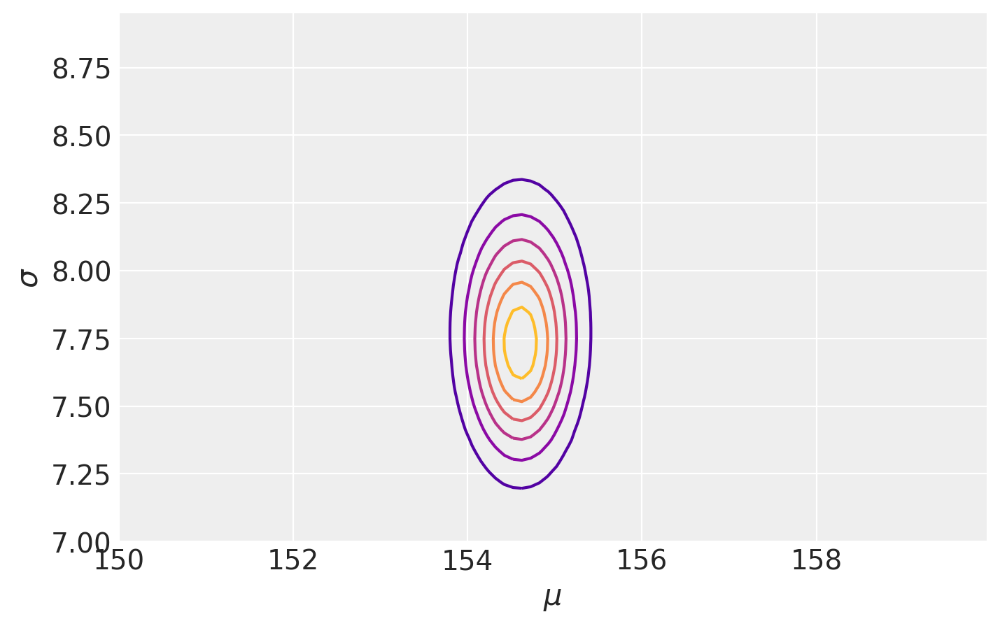

In [21]:
# posterior distributio with contour plot 
xi = np.linspace(post[:, 0].min(), post[:, 0].max(), 100)
yi = np.linspace(post[:, 1].min(), post[:, 1].max(), 100)
zi = griddata((post[:, 0], post[:, 1]), post_prob, (xi[None, :], yi[:, None]))

# plot figure
fig = plt.figure(figsize=(8, 5))
plt.contour(xi, yi, zi, cmap='plasma')
plt.xlabel('$\mu$', fontsize=15)
plt.ylabel('$\sigma$', fontsize=15)
plt.show()

### Code 4.18

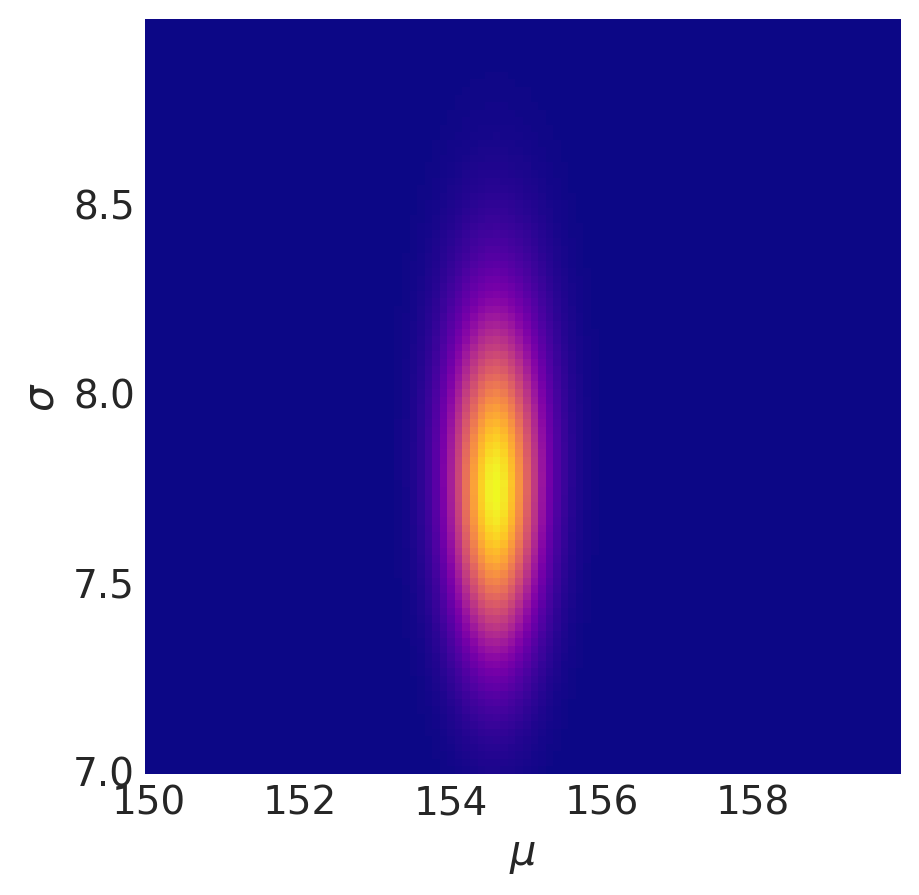

In [22]:
# posterior distributio with heat
fig = plt.figure(figsize=(8, 5))
plt.imshow(zi, origin="bottom", cmap='plasma')
plt.xlabel('$\mu$', fontsize=15)
plt.ylabel('$\sigma$', fontsize=15)
plt.xticks(np.arange(0, 100, 20), np.arange(150, 160, 2))
plt.yticks(np.arange(0, 100, 25), np.arange(7, 9, 0.5))
plt.grid(False)
plt.show()

### 4.3.4. Sampling from the posterior

### Code 4.19 and Code 4.20

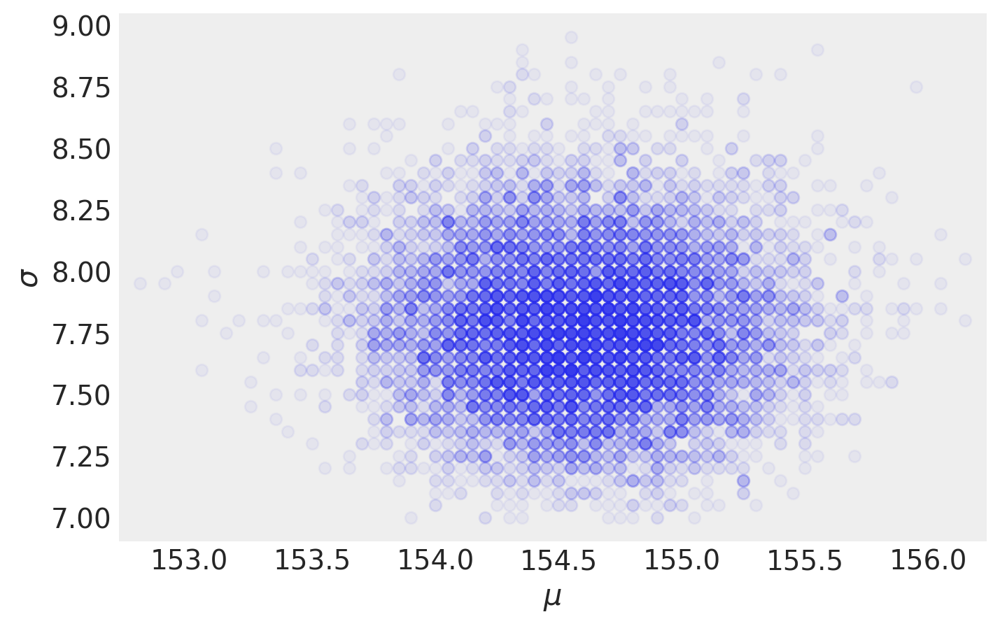

In [23]:
sample_rows = np.random.choice(
    np.arange(len(post)), size=10000, replace=True, p=post_prob/sum(post_prob))

sample_mu = post[sample_rows, 0]
sample_sigma = post[sample_rows, 1]
# plot figure
fig = plt.figure(figsize=(8, 5))
plt.plot(sample_mu, sample_sigma, 'o', alpha=0.05)
plt.xlabel('$\mu$', fontsize=15)
plt.ylabel('$\sigma$', fontsize=15)
plt.axis("equal")
plt.grid(False)
plt.show()

### Code 4.21

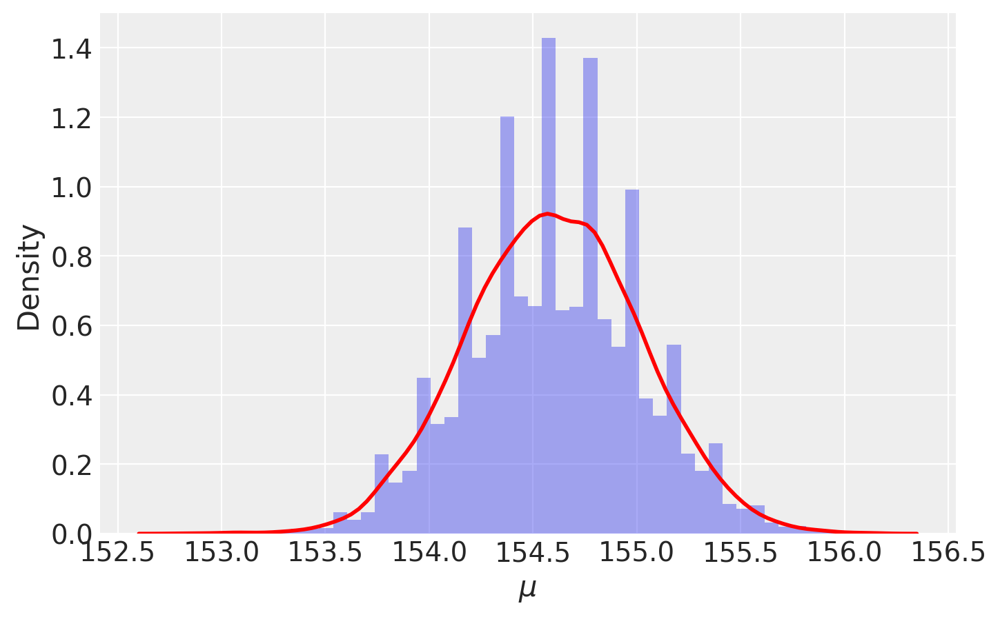

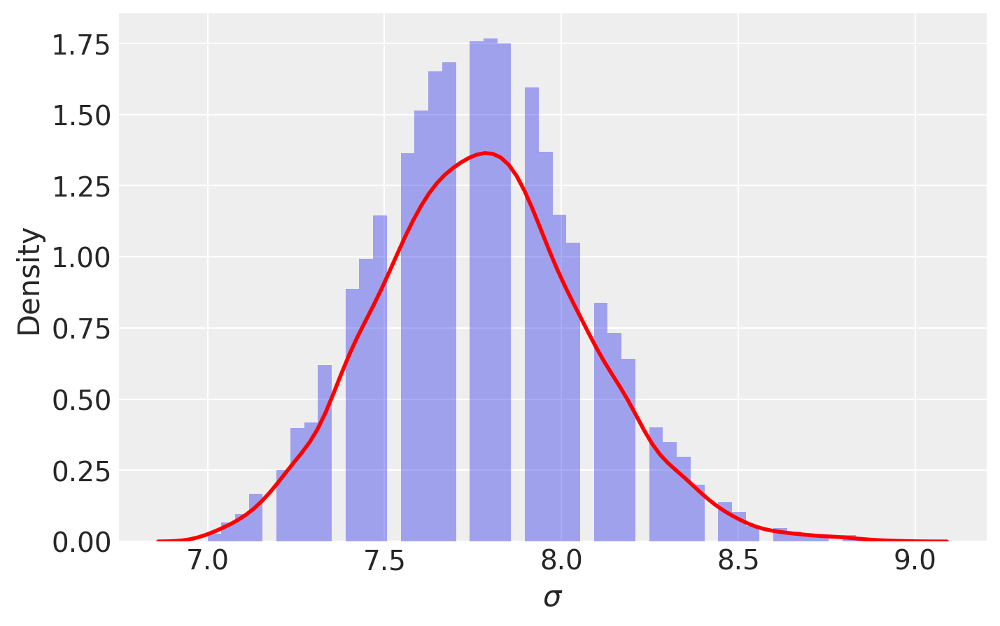

In [24]:
# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(sample_mu, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('$\mu$', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(sample_sigma, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('$\sigma$', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.22

In [25]:
az.hpd(sample_mu), az.hpd(sample_sigma)

(array([153.8 , 155.35]), array([7.15, 8.25]))

For a Gaussian likelihood and a Gaussian prior on $\mu$, the posterior distribution is always Gaussian as well, regardless of sample size. It is the standard deviation $\sigma$ that causes problems. So if you care about $\sigma$ — often people do not — you do need to be careful of abusing the quadratic approximation.

### Code 4.23 and Code 4.24

In [26]:
d3 = np.random.choice(d2.height, 20)
post2 = np.mgrid[150:170:0.1, 4:20:0.1].reshape(2, -1).T

likelihood2 = [
    sum(stats.norm.logpdf(d3, loc=post2[:, 0][i], scale=post2[:, 1][i]))
    for i in range(len(post2))
]

post_prod2 = (
    likelihood2
    + stats.norm.logpdf(post2[:, 0], loc=178, scale=20)
    + stats.uniform.logpdf(post2[:, 1], loc=0, scale=50)
)

post_prob2 = np.exp(post_prod2 - max(post_prod2))

sample_rows2 = np.random.choice(
    np.arange(len(post2)), size=10000, replace=True, p=(post_prob2 / post_prob2.sum())
)
sample_mu2 = post2[:, 0][sample_rows2]
sample_sigma2 = post2[:, 1][sample_rows2]

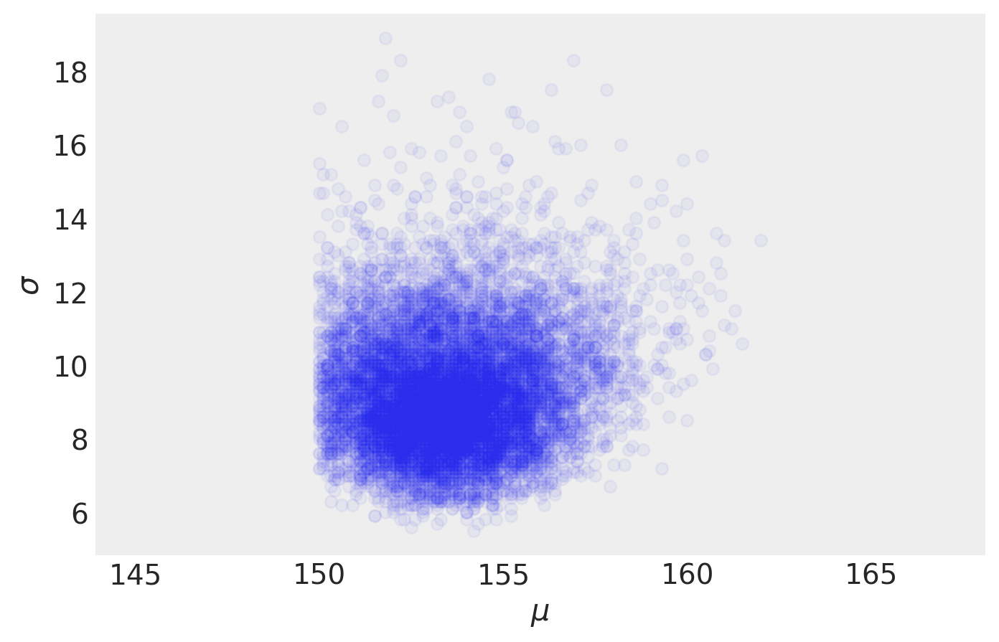

In [27]:
# plot figure
fig = plt.figure(figsize=(8, 5))
plt.plot(sample_mu2, sample_sigma2, 'o', alpha=0.05)
plt.xlabel('$\mu$', fontsize=15)
plt.ylabel('$\sigma$', fontsize=15)
plt.axis("equal")
plt.grid(False)
plt.show()

### Code 4.25

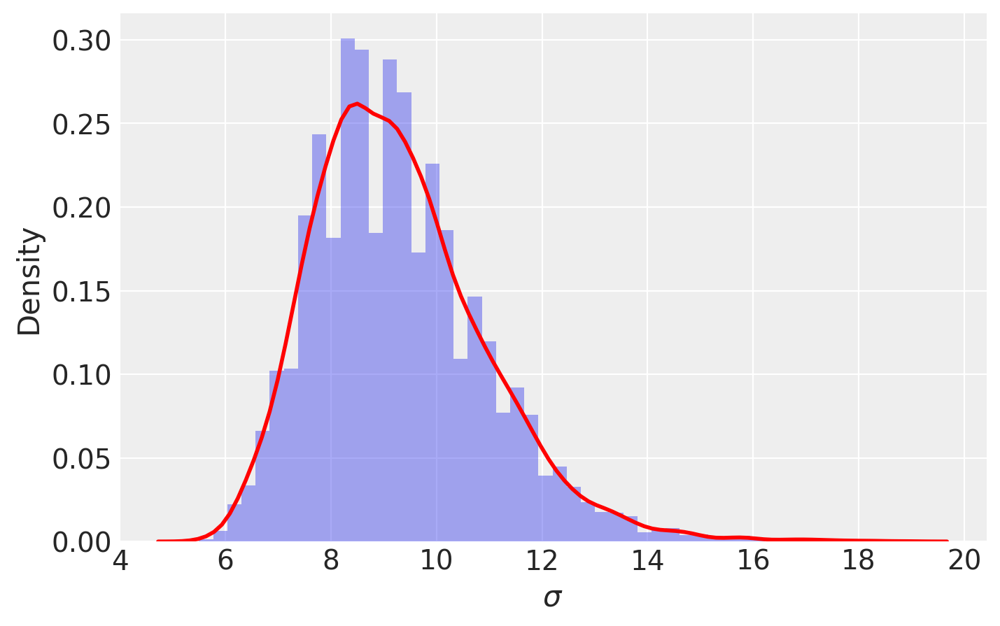

In [28]:
# plot figure
fig = plt.figure(figsize=(8, 5))
sns.distplot(sample_sigma2, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r'})
plt.xlabel('$\sigma$', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### 4.3.5. Finding the posterior distribution with quap

### Code 4.26

In [29]:
# re-load the data
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]
d2.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


### Code 4.27 - Code4.29

In [30]:
# Method 1
# define model
with pm.Model() as m4_1:
    mu = pm.Normal('mu', mu=178, sigma=20)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2.height)
    mean = pm.find_MAP()
    std_mu = ((1/pm.find_hessian(mean, vars=[mu]))**0.5)[0]
    std_sigma = ((1/pm.find_hessian(mean, vars=[sigma]))**0.5)[0]
m4_1
data = np.array([['','Mean','StdDev'],
                ['mu',mean['mu'],std_mu[0]],
                ['sigma',mean['sigma'],std_sigma[0]]])
print(pd.DataFrame(data=data[1:,1:],
                  index=data[1:,0],
                  columns=data[0,1:]))

logp = -1,235.2, ||grad|| = 11.697: 100%|██████████| 19/19 [00:00<00:00, 2056.24it/s]  


                     Mean               StdDev
mu     154.60702358123825  0.41199399266738285
sigma   7.731333025102713  0.29138557484355165


We could use a quadratic approximation like McElreath does in his book and we did in code 2.6. But Using PyMC3 is really simple to just sample from the model using a "sampler method". Most common sampler methods are members of the Markov Chain Monte Carlo Method (MCMC) family (for details read Section 2.4.3 and Chapter 8 of Statistical Rethinking).

PyMC3 comes with various samplers. Some samplers are more suited than others for certain type of variable (and/or problems). For now we are going to let PyMC3 choose the sampler for us. PyMC3 also tries to provide a reasonable starting point for the simulation. By default PyMC3 uses the same adaptive procedure as in STAN 'jitter+adapt_diag', which starts with a identity mass matrix and then adapts a diagonal based on the variance of the tuning samples.

In [31]:
# Method 2
# define model
with pm.Model() as m4_1:
    mu = pm.Normal('mu', mu=178, sigma=20)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2.height)
    mean = pm.find_MAP()

m4_1

with m4_1:
    trace_4_1 = pm.sample(1000, tune=1000)

logp = -1,235.2, ||grad|| = 11.697: 100%|██████████| 19/19 [00:00<00:00, 3698.51it/s]  
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 5495.97draws/s]


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12cf09910>,
      dtype=object)

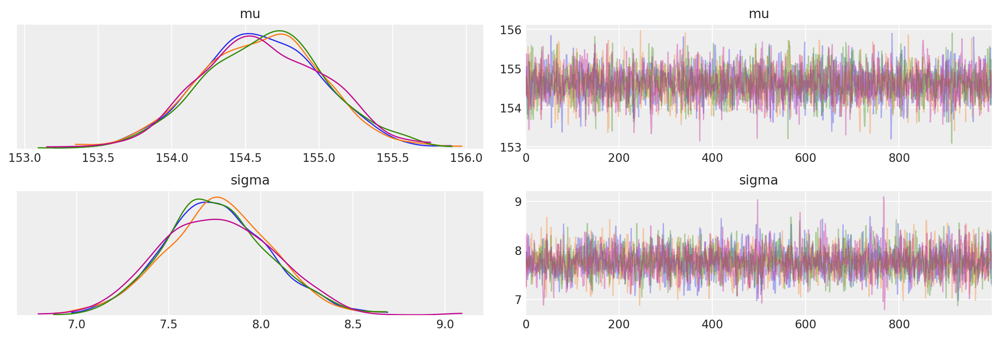

In [32]:
# this function lets you check the samples values
az.plot_trace(trace_4_1)

In [33]:
az.summary(trace_4_1, round_to=3, kind="stats")

,mean,sd,hpd_3%,hpd_97%
mu,154.617,0.417,153.844,155.383
sigma,7.765,0.292,7.247,8.338


### Code 4.30

In [34]:
with pm.Model() as m4_1:
    mu = pm.Normal("mu", mu=178, sd=20, testval=d2.height.mean())
    sigma = pm.Uniform("sigma", lower=0, upper=50, testval=d2.height.std())
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 4508.66draws/s]


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12d12d450>,
      dtype=object)

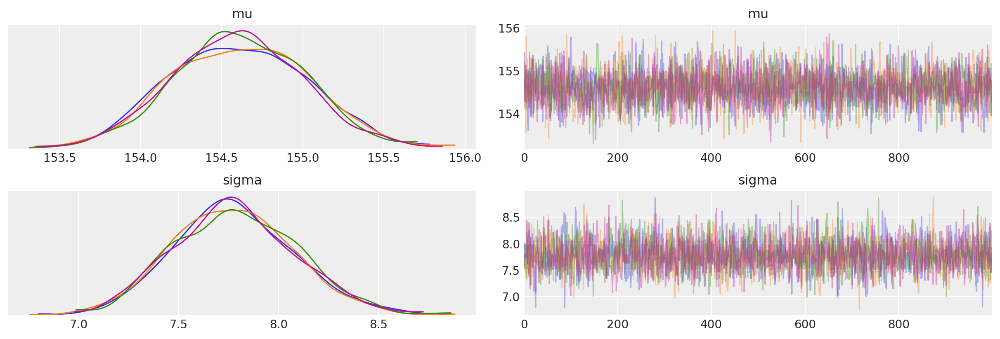

In [35]:
az.plot_trace(trace_4_1)

### Code 4.31

In [36]:
with pm.Model() as m4_2:
    mu = pm.Normal("mu", mu=178, sd=0.1, testval=d2.height.mean())
    sigma = pm.Uniform("sigma", lower=0, upper=50, testval=d2.height.std())
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_2 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 4807.52draws/s]


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12beb4fd0>,
      dtype=object)

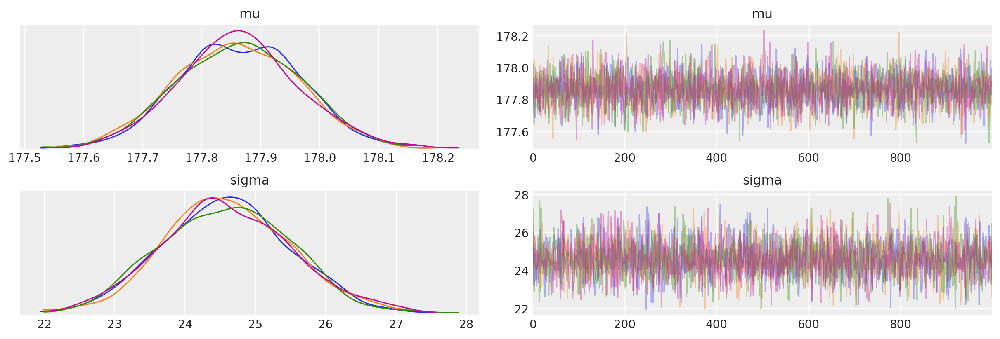

In [37]:
az.plot_trace(trace_4_2)

In [38]:
az.summary(trace_4_2, round_to=2, kind="stats")

,mean,sd,hpd_3%,hpd_97%
mu,177.86,0.10,177.69,178.07
sigma,24.61,0.94,22.83,26.34


### 4.3.6. Sampling from a quap

For some computations could be nice to have the trace turned into a DataFrame, this can be done using the trace_to_dataframe function

### Code 4.32

In [39]:
trace_df = pm.trace_to_dataframe(trace_4_1)
trace_df.cov()

,mu,sigma
mu,0.169235,0.001108
sigma,0.001108,0.091356


### Code 4.33

In [40]:
np.diag(trace_df.cov())

array([0.16923483, 0.09135628])

In [41]:
trace_df.corr()

,mu,sigma
mu,1.000000,0.008908
sigma,0.008908,1.000000


### Code 4.34

We did not use the quadratic approximation, instead we use a MCMC method to sample from the posterior. Thus, we already have samples. We can do something like

In [42]:
trace_df.head()

,mu,sigma
0,154.317306,7.551034
1,155.418319,8.010309
2,155.217778,7.736473
3,154.291091,7.645968
4,154.995688,7.993712


In [43]:
trace_4_1["sigma"][:10]

array([7.55103383, 8.01030927, 7.73647286, 7.64596829, 7.99371206,
       7.70738754, 7.90432251, 7.63995254, 7.62383558, 8.1399246 ])

In [44]:
trace_4_1["mu"][:10]

array([154.31730572, 155.41831887, 155.21777798, 154.29109108,
       154.99568825, 154.72905042, 154.6745386 , 154.64945192,
       153.81200728, 153.6096339 ])

### Code 4.35

In [45]:
az.summary(trace_4_1, round_to=2, kind="stats")

,mean,sd,hpd_3%,hpd_97%
mu,154.61,0.41,153.87,155.40
sigma,7.78,0.30,7.21,8.34


### Code 4.36

In [46]:
# simulates random vectors of multivariate Gaussian values
stats.multivariate_normal.rvs(mean=trace_df.mean(), cov=trace_df.cov(), size=10)

array([[154.24103318,   8.08082765],
       [153.98821999,   8.18354405],
       [154.72706349,   8.11378707],
       [155.0362936 ,   7.82139913],
       [154.54996626,   7.93542014],
       [154.8195869 ,   7.91542616],
       [154.28504666,   7.69765451],
       [153.95482368,   7.98515876],
       [154.71665599,   7.58417796],
       [154.33311171,   7.57318278]])

## 4.4. Linear prediction

### Code 4.37

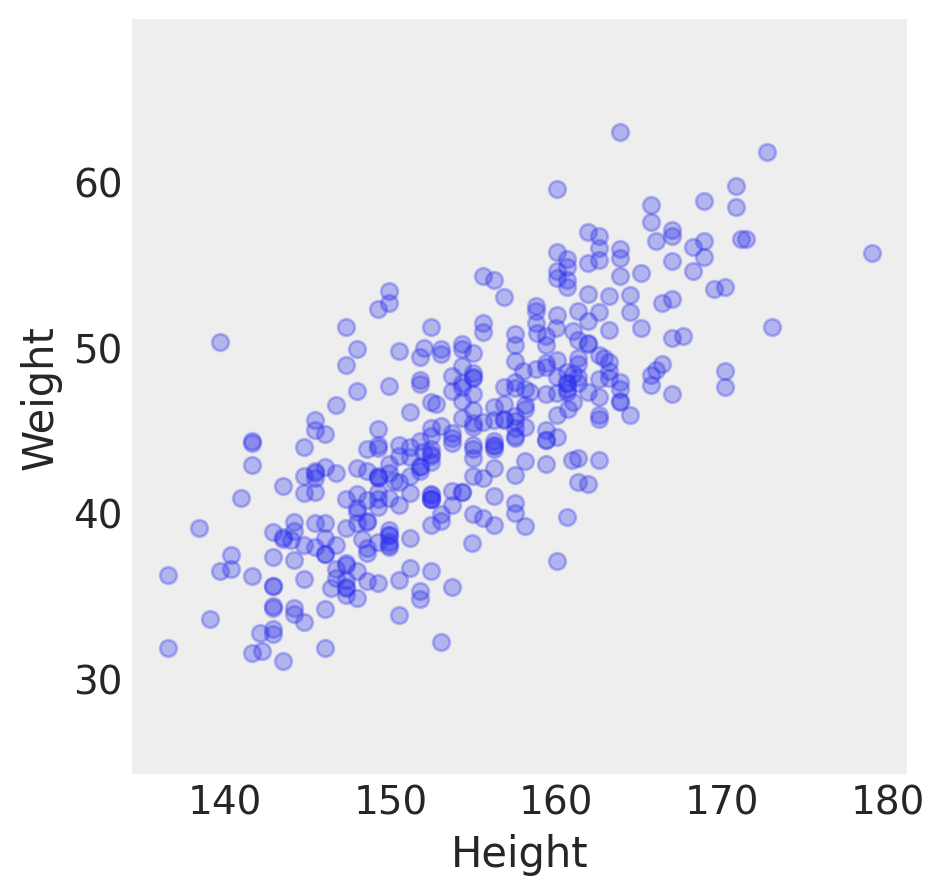

In [47]:
# plot height and weight against one another
fig = plt.figure(figsize=(5, 5))
plt.plot(d2.height, d2.weight, 'o', alpha=0.3)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Weight', fontsize=15)
plt.axis("equal")
plt.grid(False)
plt.show()

### 4.4.1. The linear model strategy

### Code 4.38

In [48]:
# simulate lines implied by the priors for α and β
N = 100
a = stats.norm.rvs(loc=178, scale=20, size=N)
b = stats.norm.rvs(loc=0, scale=10, size=N)

### Code 4.39

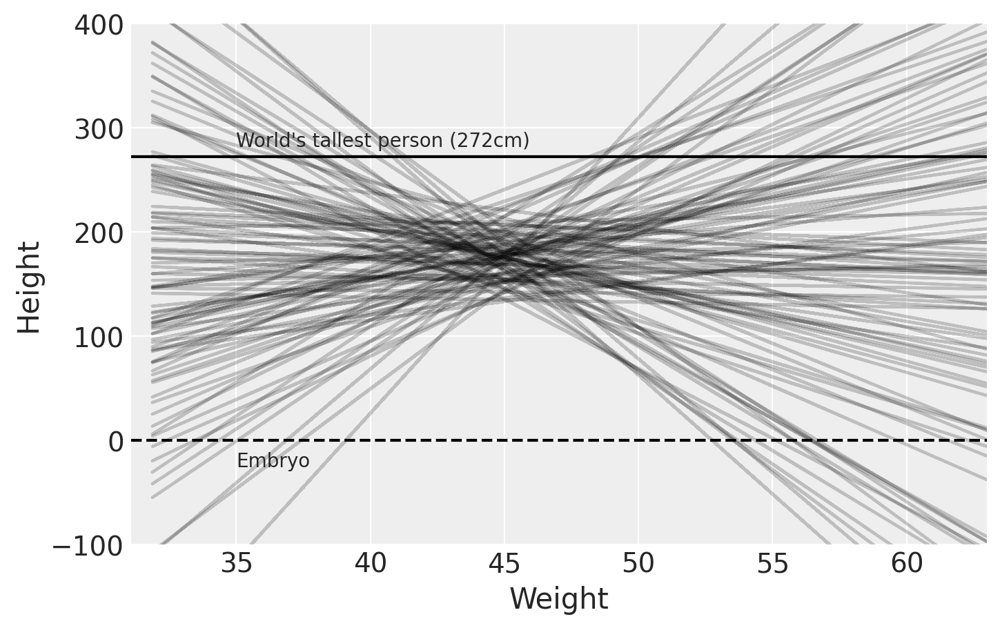

In [49]:
# plot lines
fig = plt.figure(figsize=(8, 5))
for n in range(N):
    plt.plot(d2.weight[:N], a[n] + b[n] * (d2.weight[:N] - d2.weight.mean()), "k", alpha=0.2)
plt.xlim(d2.weight.min(), d2.weight.max())
plt.ylim(-100, 400)
plt.axhline(0, c="k", ls="--")
plt.axhline(272, c="k")
plt.xlabel("Weight", fontsize=15)
plt.ylabel("Height", fontsize=15)
plt.text(x=35, y=282, s="World's tallest person (272cm)")
plt.text(x=35, y=-25, s="Embryo");
plt.show()

### Code 4.40

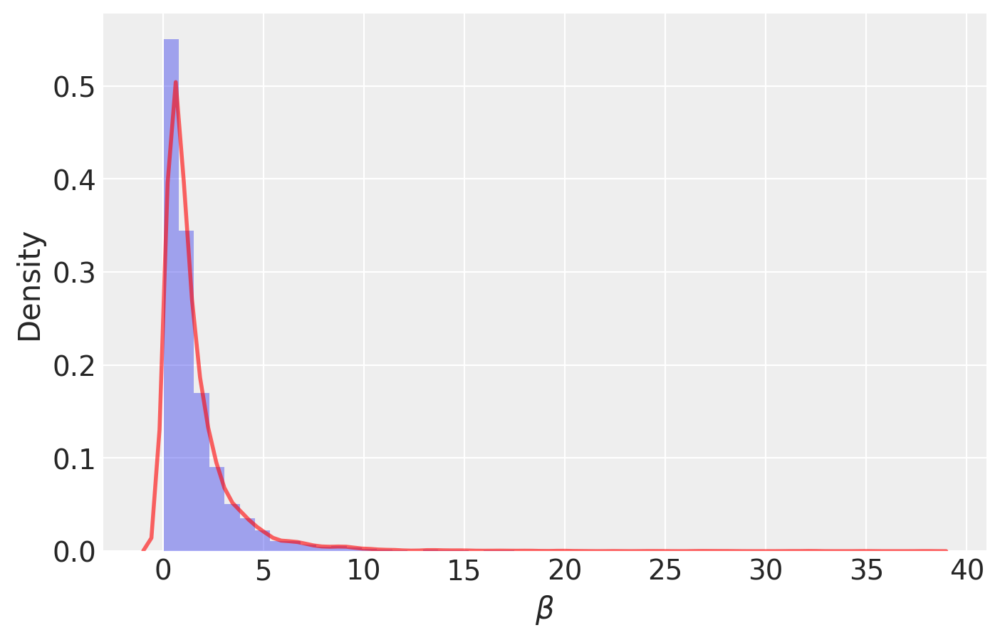

In [50]:
b = stats.lognorm.rvs(s=1, loc=0, scale=1, size=10000)

fig = plt.figure(figsize=(8, 5))
sns.distplot(b, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r', 'alpha': 0.6})
plt.xlabel(r'$\beta$', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.41

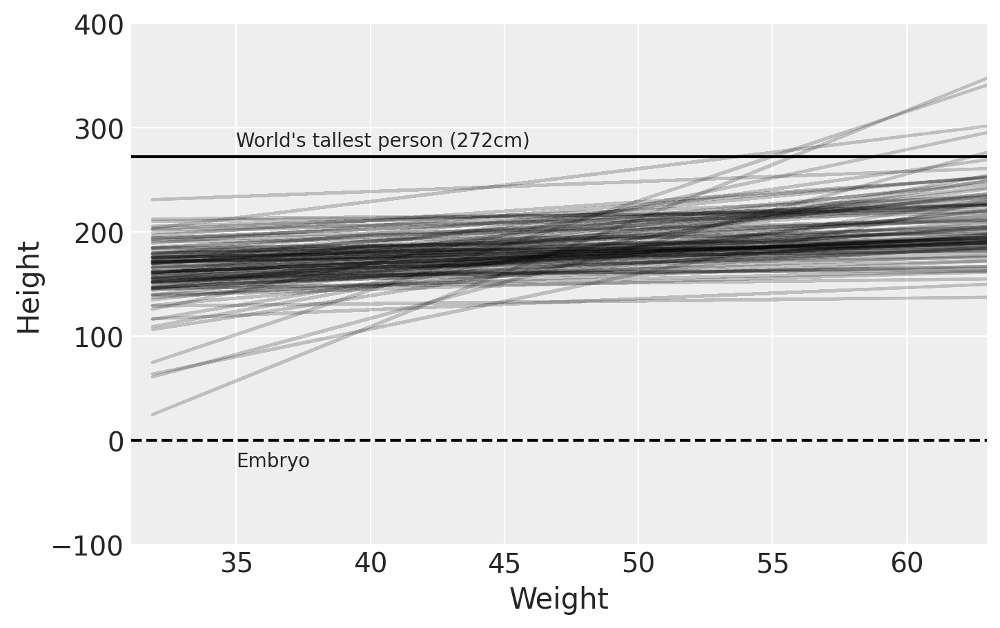

In [51]:
# simulate lines implied by the priors for α and log β
N = 100
a = stats.norm.rvs(loc=178, scale=20, size=N)
b = stats.lognorm.rvs(s=1, loc=0, scale=1, size=N)

# plot lines
fig = plt.figure(figsize=(8, 5))
for n in range(N):
    plt.plot(d2.weight[:N], a[n] + b[n] * (d2.weight[:N] - d2.weight.mean()), "k", alpha=0.2)
plt.xlim(d2.weight.min(), d2.weight.max())
plt.ylim(-100, 400)
plt.axhline(0, c="k", ls="--")
plt.axhline(272, c="k")
plt.xlabel("Weight", fontsize=15)
plt.ylabel("Height", fontsize=15)
plt.text(x=35, y=282, s="World's tallest person (272cm)")
plt.text(x=35, y=-25, s="Embryo");
plt.show()

### 4.4.2. Finding the posterior distribution

### Code 4.42

In [52]:
# define model
xbar = d2.weight.mean()
with pm.Model() as m4_3:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    mu = a + b*(d2.weight-xbar)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2.height)
    trace_4_3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 4120.39draws/s]


In [53]:
az.summary(trace_4_3, round_to=2, kind="stats")

,mean,sd,hpd_3%,hpd_97%
a,154.59,0.28,154.11,155.14
b,0.90,0.04,0.82,0.98
sigma,5.10,0.20,4.75,5.47


### Code 4.43

In [54]:
# define model
xbar = d2.weight.mean()
with pm.Model() as m4_3b:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    mu = a + np.exp(b)*(d2.weight-xbar)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2.height)
    trace_4_3b = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 4160.79draws/s]


In [55]:
az.summary(trace_4_3b, round_to=2, kind="stats")

,mean,sd,hpd_3%,hpd_97%
a,154.59,0.28,154.09,155.14
b,0.04,0.02,0.01,0.07
sigma,5.17,0.20,4.80,5.54


### 4.4.3. Interpreting the posterior distribution

### Code 4.44

In [56]:
az.summary(trace_4_3, round_to=2, kind="stats")

,mean,sd,hpd_3%,hpd_97%
a,154.59,0.28,154.11,155.14
b,0.90,0.04,0.82,0.98
sigma,5.10,0.20,4.75,5.47


### Code 4.45

In [57]:
# calculate covariances among the parameters
trace_df = pm.trace_to_dataframe(trace_4_3)
trace_df.cov()

,a,b,sigma
a,0.076928,0.000726,0.000153
b,0.000726,0.001874,0.000004
sigma,0.000153,0.000004,0.038043


### Code 4.46

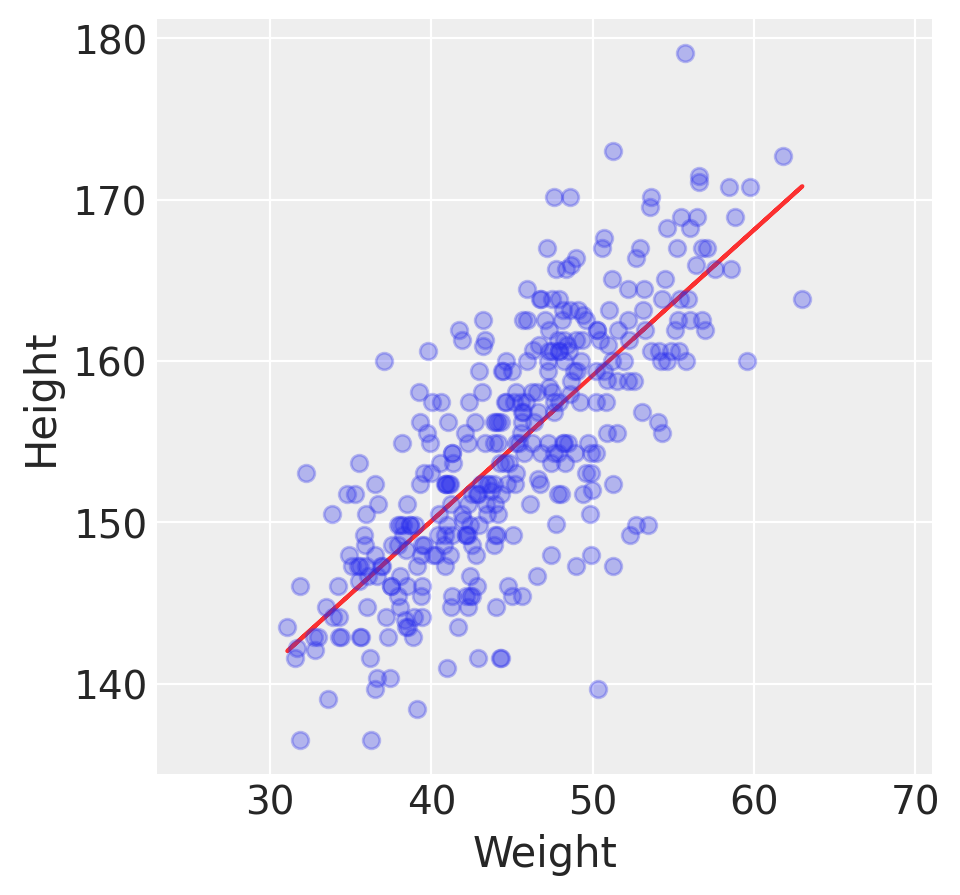

In [58]:
# get samples from posterior
trace_df = pm.trace_to_dataframe(trace_4_3)
a_map = trace_df.a.mean()
b_map = trace_df.b.mean()
# plot results
fig = plt.figure(figsize=(5, 5))
plt.plot(d2.weight, a_map + b_map * (d2.weight - d2.weight.mean()), "r", alpha=0.8)
plt.plot(d2.weight, d2.height, 'o', alpha=0.3)
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.axis("equal")
plt.show()


### Code 4.47

In [59]:
trace_df.head(5)

,a,b,sigma
0,154.573700,0.922840,5.093862
1,154.573700,0.922840,5.093862
2,154.643536,0.846452,4.956560
3,154.790841,0.884456,5.484456
4,154.489484,0.907096,5.151078


### Code 4.48 and 4.49

In [60]:
# extracts the first 10 cases 
N = 50
dN = d2[:N]

#re-estimates the model
xbar = dN.weight.mean()
with pm.Model() as m_N:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    mu = a + np.exp(b)*(dN.weight-xbar)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=dN.height)
    mu = pm.Deterministic("mu", a + b * (dN.weight - dN.weight.mean()))
    trace_m_N = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:01<00:00, 4218.35draws/s]


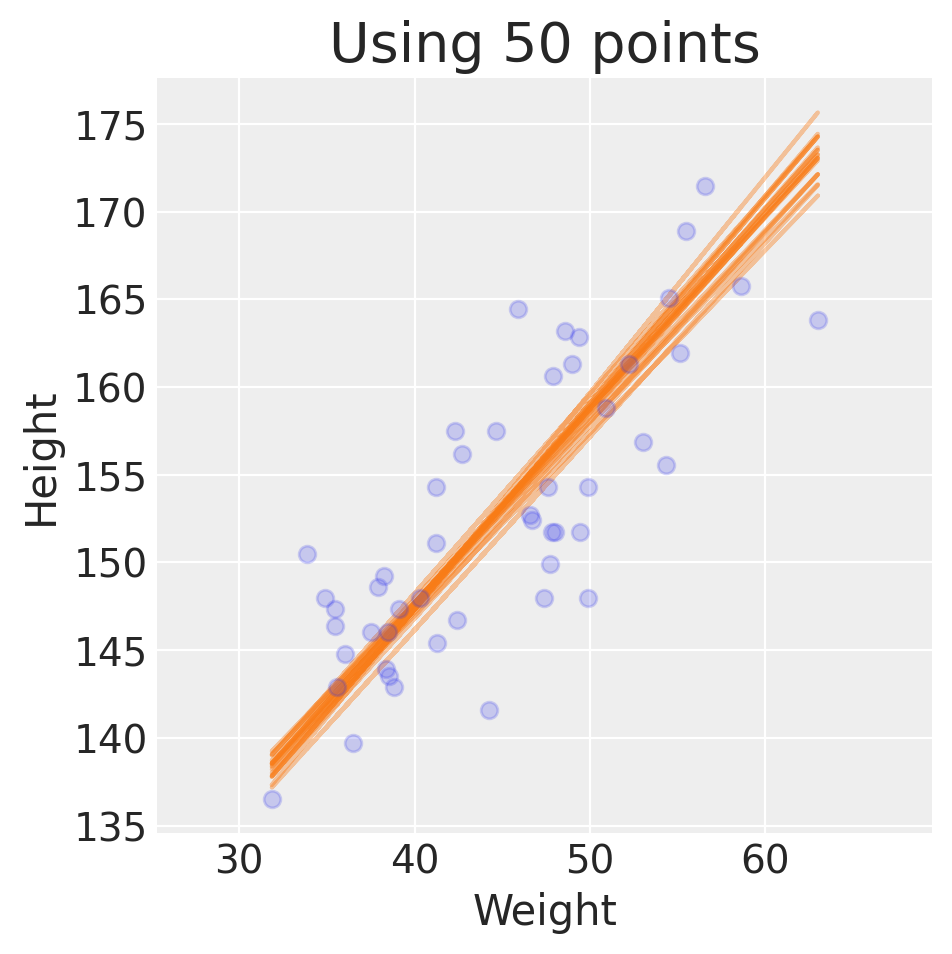

In [61]:
# extract 20 samples from the posterior
trace_df = pm.trace_to_dataframe(trace_m_N)
index = np.random.randint(len(trace_df), size=20)

# plot results
fig = plt.figure(figsize=(5, 5))
for n in range(20):
    plt.plot(dN.weight, trace_df.a[n] + np.exp(trace_df.b[n]) * (dN.weight - dN.weight.mean()), "C1", alpha=0.4)
plt.plot(dN.weight, dN.height, 'o', alpha=0.2)
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.title('Using {} points'.format(N), fontsize=20)
plt.axis("equal")
plt.show()

### Code 4.50 and Code 4.51

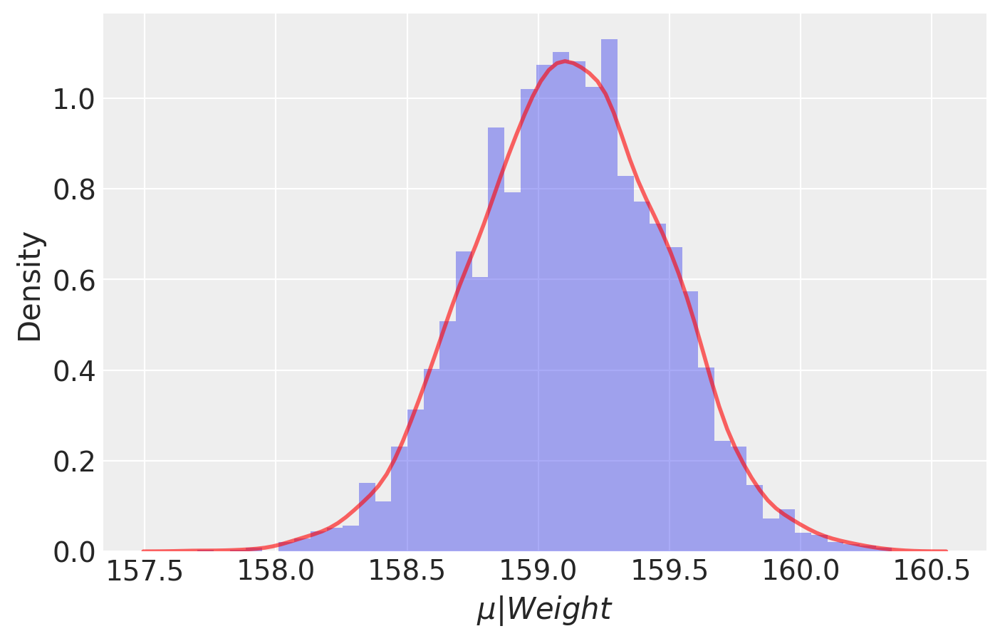

In [62]:
# darw your samples from the posterior at 50kg
post = pm.trace_to_dataframe(trace_4_3)
mu_at_50 = post.a + post.b*(50 - d2.weight.mean())

# plot results
fig = plt.figure(figsize=(8, 5))
sns.distplot(mu_at_50, hist = True, kde = True, kde_kws = {'linewidth': 2, 'color': 'r', 'alpha': 0.6})
plt.xlabel(r'$\mu | Weight$', fontsize=15)
plt.ylabel('Density', fontsize=15)
plt.show()

### Code 4.52

In [63]:
# Credible interval to compute. Defaults to 0.94. 89% compatibility interval 
az.hpd(mu_at_50)

array([158.44992957, 159.78500731])

### Code 4.53 and Code 4.54

We are doing manually, in the book is done using the link function. In the book on code 4.58 the following operations are performed manually.

In [64]:
# define sequence of weights to compute predictions for
# these values will be on the horizontal axis
weight_seq = np.arange(25, 71)

# init saving space
mu_pred = np.zeros((len(weight_seq), len(trace_4_3) * trace_4_3.nchains))
# calculate posterior for each mu
for n, w in enumerate(weight_seq):
    mu_pred[n] = trace_4_3['a'] + trace_4_3['b']*(w - d2.weight.mean())

### Code 4.55

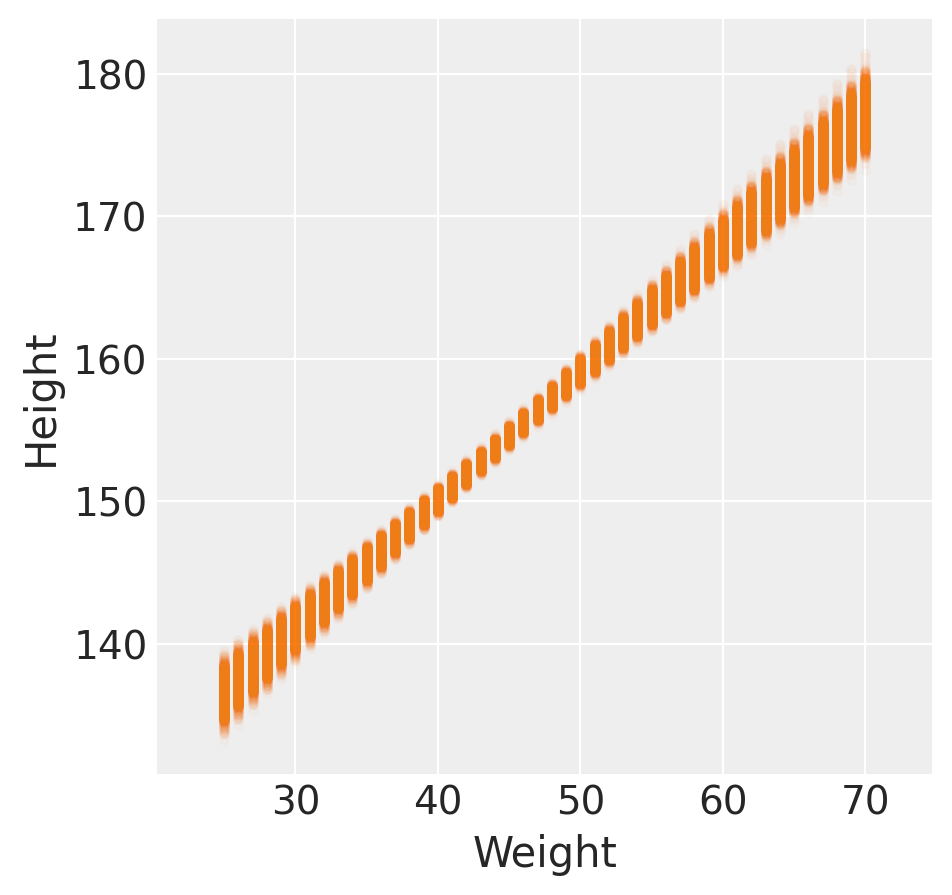

In [65]:
# plot results
fig = plt.figure(figsize=(5, 5))
plt.plot(weight_seq, mu_pred, ".C1", alpha=0.02)
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.axis("equal")
plt.show()

### Code 4.56

In [66]:
# summarize the distribution for each weight value.
mu_mean = mu_pred.mean(1)
mu_hpd = az.hpd(mu_pred.T)

### Code 4.57

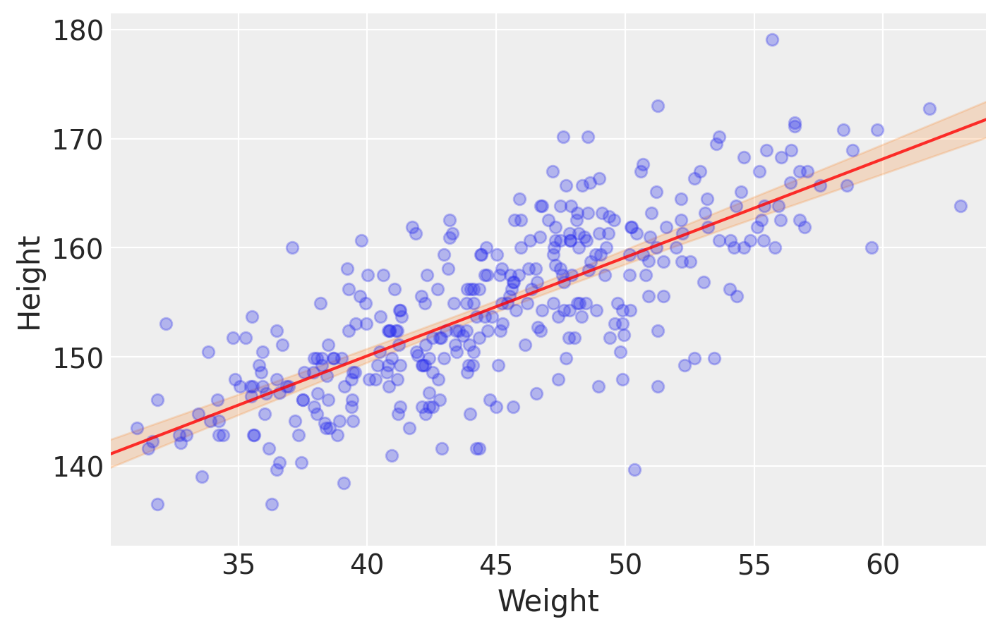

In [67]:
# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(d2.weight, d2.height, 'o', alpha=0.3)
plt.plot(weight_seq, mu_mean, "r", alpha=0.8)
az.plot_hpd(weight_seq, mu_pred.T, color='C1', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d2.weight.min()-1, d2.weight.max()+1)
plt.show()

### Code 4.58

the code is similar to what we did in Code 4.53 and Code 4.54

### Code 4.59

Now we are going to use ```sample_posterior_predictive()``` from PyCM3. This function gives us posterior predictive samples, that is for each value of the input variable we get a sample (from the posterior) of the output variable. Thus in the following example the shape of ```height_pred['height'].shape``` is (200, 352)

In [68]:
height_pred = pm.sample_posterior_predictive(trace=trace_4_3, samples=200, model=m4_3)

/Users/yifei-wang/.pyenv/versions/3.7.4/envs/Statistical_Rethinking/lib/python3.7/site-packages/pymc3/sampling.py:1247: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "
100%|██████████| 200/200 [00:00<00:00, 802.17it/s]


In [69]:
np.shape(height_pred['height'])

(200, 352)

### Code 4.60

In [70]:
mu_hpd = az.hpd(height_pred['height'])
mu_hpd

array([[147.71867138, 166.18356161],
       [136.81354938, 156.92570726],
       [134.45543558, 151.92417702],
       [152.53148865, 171.26575649],
       [141.66735666, 159.65870468],
       [161.51719566, 179.32404562],
       [141.34003158, 160.18359948],
       [155.34252478, 174.28022844],
       [137.17810022, 155.86432428],
       [155.20215904, 172.32827809],
       [148.81934056, 168.80702656],
       [141.87208123, 161.23446877],
       [137.22603064, 155.59190584],
       [147.12011069, 166.51100474],
       [134.06442876, 153.35057314],
       [148.91217931, 167.48291886],
       [142.98039931, 163.4380554 ],
       [138.30439697, 159.25379694],
       [148.25656395, 166.72548493],
       [143.49510559, 162.40084006],
       [136.05394505, 157.21621499],
       [139.52759983, 160.42414511],
       [136.91406275, 153.76735689],
       [140.00861944, 160.27624432],
       [154.4230321 , 173.73126294],
       [134.90465941, 156.22714947],
       [140.39501965, 158.33840501],
 

### Code 4.61

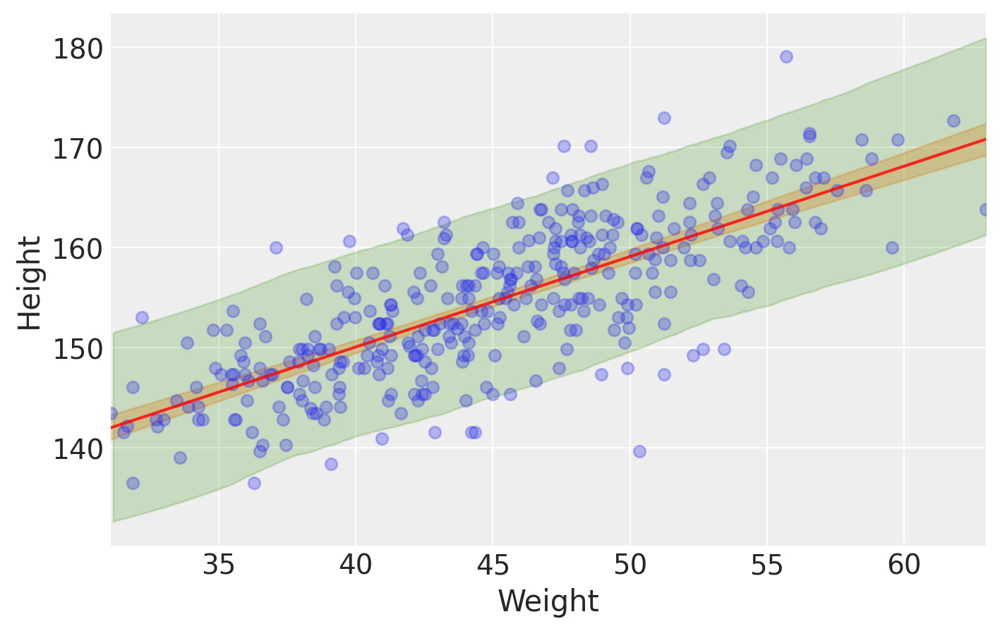

In [71]:
# plot everything we’ve built up: 
# (1) the average line
# (2) the shaded region of 89% plausible μ
# (3) the boundaries of the simulated heights the model expects
fig = plt.figure(figsize=(8, 5))
plt.plot(d2.weight, d2.height, 'o', alpha=0.3)
plt.plot(weight_seq, mu_mean, "r", alpha=0.8)
az.plot_hpd(weight_seq, mu_pred.T, color='C1', fill_kwargs={'alpha': 0.3})
az.plot_hpd(d2.weight, height_pred["height"], color='C2', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d2.weight.min(), d2.weight.max())
plt.show()

### Code 4.62

In [72]:
height_pred = pm.sample_posterior_predictive(trace=trace_4_3, samples=10000, model=m4_3)

100%|██████████| 10000/10000 [00:10<00:00, 987.81it/s]


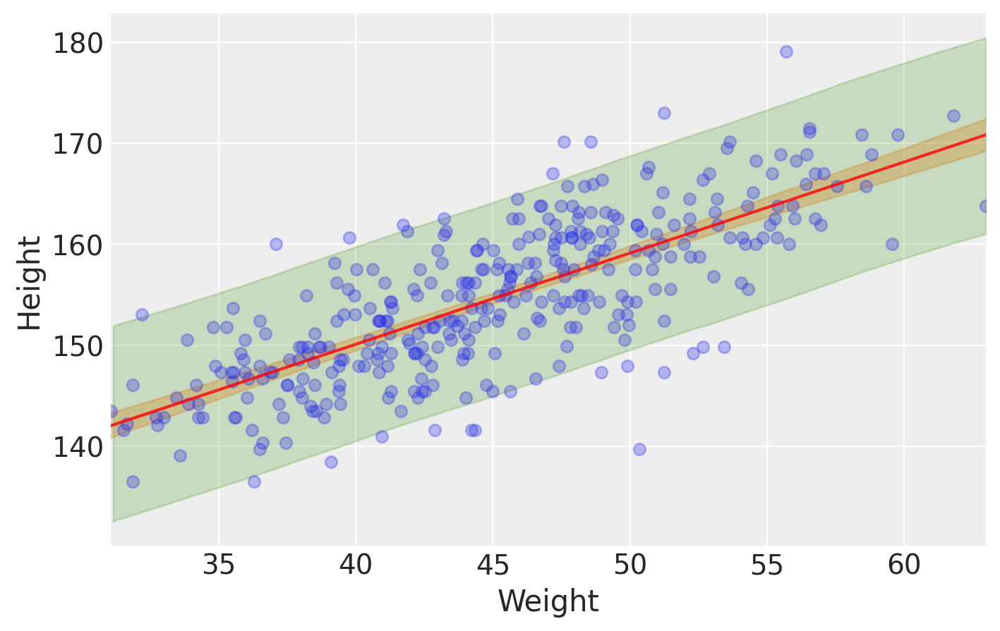

In [73]:
# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(d2.weight, d2.height, 'o', alpha=0.3)
plt.plot(weight_seq, mu_mean, "r", alpha=0.8)
az.plot_hpd(weight_seq, mu_pred.T, color='C1', fill_kwargs={'alpha': 0.3})
az.plot_hpd(d2.weight, height_pred["height"], color='C2', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d2.weight.min(), d2.weight.max())
plt.show()

### Code 4.63

Now we are going to generate heights from the posterior manually. Instead of restricting ourselves to the input values, we are going to pass an array of equally spaced weights values, called ```weight_seg```.

In [74]:
weight_seq = np.arange(25, 71)
post_samples = []
for _ in range(1000):  # number of samples from the posterior
    i = np.random.randint(len(trace_4_3))
    mu_pr = trace_4_3["a"][i] + trace_4_3["b"][i] * (weight_seq - d2.weight.mean())
    sigma_pred = trace_4_3["sigma"][i]
    post_samples.append(np.random.normal(mu_pr, sigma_pred))

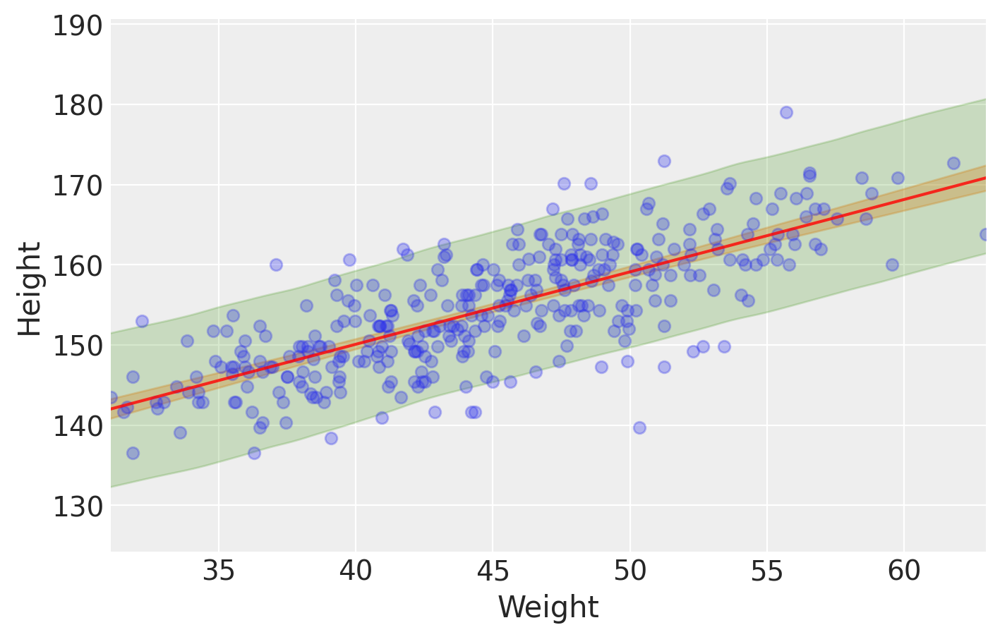

In [75]:
# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(d2.weight, d2.height, 'o', alpha=0.3)
plt.plot(weight_seq, mu_mean, "r", alpha=0.8)
az.plot_hpd(weight_seq, mu_pred.T, color='C1', fill_kwargs={'alpha': 0.3})
az.plot_hpd(weight_seq, np.array(post_samples), color='C2', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d2.weight.min(), d2.weight.max())
plt.show()

## 4.5. Curves from lines

### 4.5.1. Polynomial regression

### Code 4.64

In [76]:
# partial census data by Nancy Howell
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


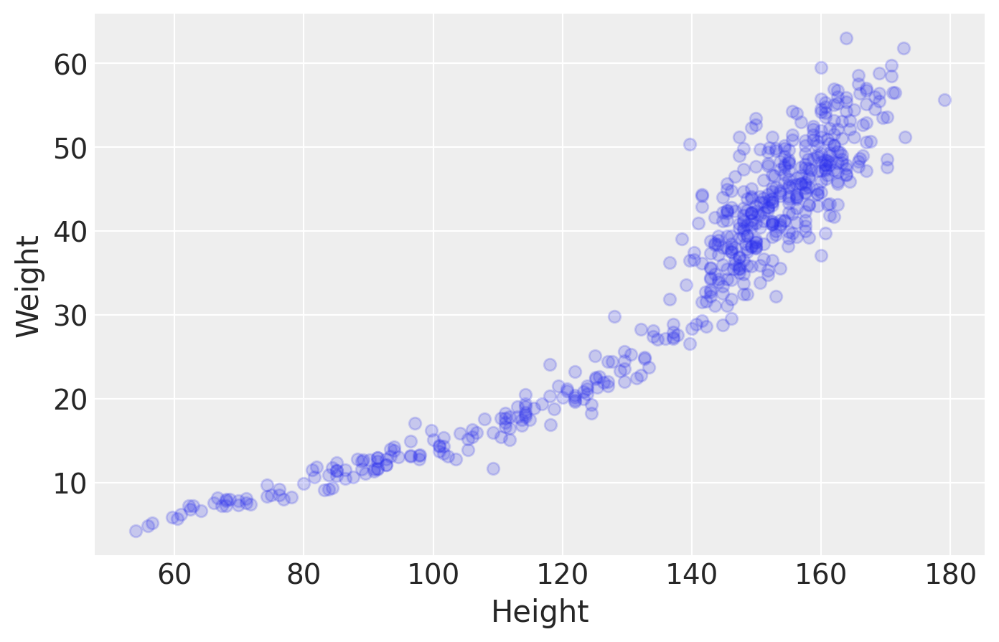

In [77]:
# plot height and weight against one another
fig = plt.figure(figsize=(8, 5))
plt.plot(d.height, d.weight, 'o', alpha=0.2)
plt.xlabel('Height', fontsize=15)
plt.ylabel('Weight', fontsize=15)
plt.show()

### Code 4.65 and Code 4.66

In [78]:
# standardize data
d["weight_std"] = (d.weight - d.weight.mean()) / d.weight.std()
d["weight_std2"] = d.weight_std ** 2

In [79]:
# define model quadratic regression
with pm.Model() as m4_5:
    a = pm.Normal('a', mu=178, sigma=20)
    b1 = pm.Lognormal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    #mu = a + b1*d.weight_std + b2*d.weight_std2
    mu = pm.Deterministic("mu", a + b1*d.weight_std + b2*d.weight_std2)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d.height)
    trace_4_5 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b2, b1, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:02<00:00, 2866.56draws/s]


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12d6d87d0>,
      dtype=object)

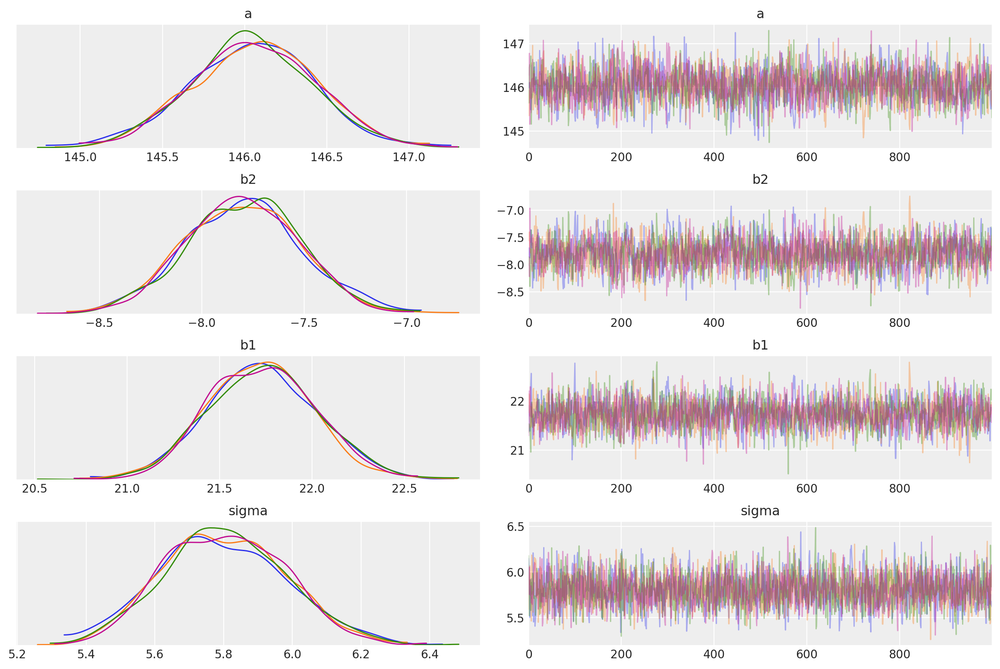

In [80]:
varnames = ["~mu"]
az.plot_trace(trace_4_5, varnames)

In [81]:
az.summary(trace_4_5, varnames, kind="stats", round_to=2)

,mean,sd,hpd_3%,hpd_97%
a,146.05,0.38,145.30,146.71
b2,-7.80,0.28,-8.32,-7.27
b1,21.73,0.29,21.20,22.26
sigma,5.80,0.18,5.48,6.14


### Code 4.67 and Code 4.68

In [82]:
mu_pred = trace_4_5["mu"]
height_pred = pm.sample_posterior_predictive(trace=trace_4_5, samples=200, model=m4_5)

/Users/yifei-wang/.pyenv/versions/3.7.4/envs/Statistical_Rethinking/lib/python3.7/site-packages/pymc3/sampling.py:1247: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "
100%|██████████| 200/200 [00:00<00:00, 767.74it/s]


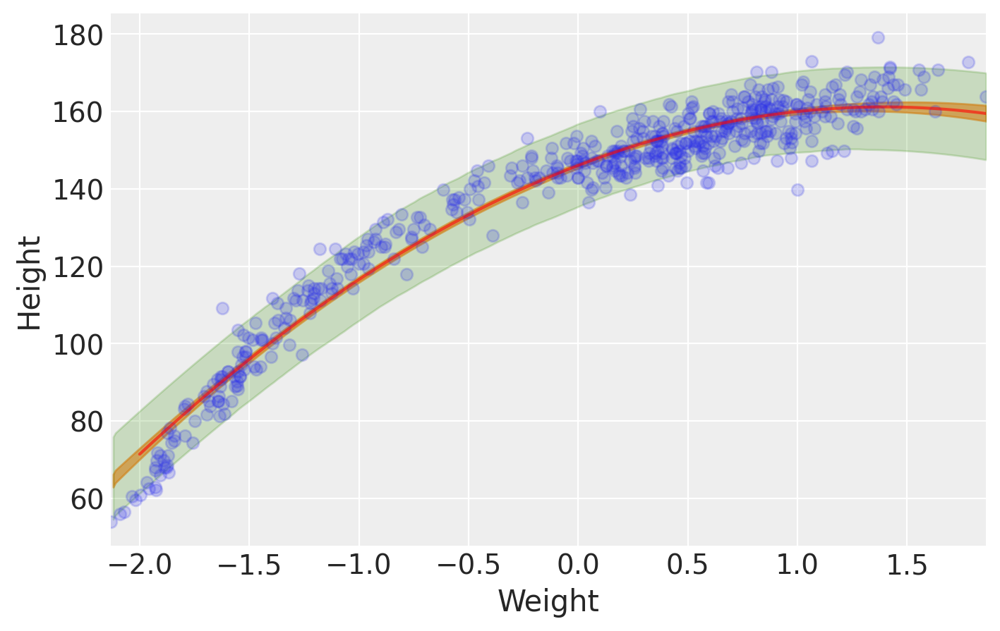

In [83]:
# calculate mean for quadratic curve
weight_seq = np.arange(-2, 2, 0.01)
height_seq = trace_4_5["a"].mean() + trace_4_5["b1"].mean()*weight_seq + trace_4_5["b2"].mean()*weight_seq**2

# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(d.weight_std, d.height, 'o', alpha=0.2)
# mean
plt.plot(weight_seq, height_seq, "r", alpha=0.6)
# CI for mean
az.plot_hpd(d.weight_std, mu_pred, color='C1', fill_kwargs={'alpha': 0.6})
# CI for height
az.plot_hpd(d.weight_std, height_pred["height"], color='C2', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d.weight_std.min(), d.weight_std.max())
plt.show()

### Code 4.69

In [84]:
d["weight_std3"] = d.weight_std ** 3

In [85]:
# define model cubic regression 
with pm.Model() as m4_6:
    a = pm.Normal('a', mu=178, sigma=20)
    b1 = pm.Lognormal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    b3 = pm.Normal('b3', mu=0, sigma=1)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    mu = pm.Deterministic("mu", a + b1*d.weight_std + b2*d.weight_std2 + b3*d.weight_std3)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d.height)
    trace_4_6 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b3, b2, b1, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:04<00:00, 1672.12draws/s]


In [86]:
az.summary(trace_4_6, varnames, kind="stats", round_to=2)

,mean,sd,hpd_3%,hpd_97%
a,146.39,0.32,145.83,147.01
b2,-6.20,0.27,-6.70,-5.69
b3,3.59,0.23,3.14,4.01
b1,15.21,0.47,14.36,16.11
sigma,4.86,0.15,4.59,5.16


We will stack the weights to get a 2D array, these simplifies wrriting a model. Now we can compute the dot product between beta and the 2D-array

In [87]:
weight_m = np.vstack((d.weight_std, d.weight_std ** 2, d.weight_std ** 3))

In [88]:
with pm.Model() as m_4_6b:
    a = pm.Normal("a", mu=178, sd=100)
    b = pm.Normal("b", mu=0, sd=10, shape=3)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + pm.math.dot(b, weight_m))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)
    trace_4_6b = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:03<00:00, 2078.33draws/s]


In [89]:
az.summary(trace_4_6b, varnames, kind="stats", round_to=2)

,mean,sd,hpd_3%,hpd_97%
a,146.73,0.32,146.14,147.35
b[0],15.04,0.50,14.08,15.97
b[1],-6.54,0.27,-7.03,-6.04
b[2],3.59,0.24,3.11,4.00
sigma,4.85,0.15,4.59,5.13


### Code 4.70 and 4.71

In [90]:
mu_pred = trace_4_6["mu"]
height_pred = pm.sample_posterior_predictive(trace=trace_4_6, samples=200, model=m4_6)

/Users/yifei-wang/.pyenv/versions/3.7.4/envs/Statistical_Rethinking/lib/python3.7/site-packages/pymc3/sampling.py:1247: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "
100%|██████████| 200/200 [00:00<00:00, 677.92it/s]


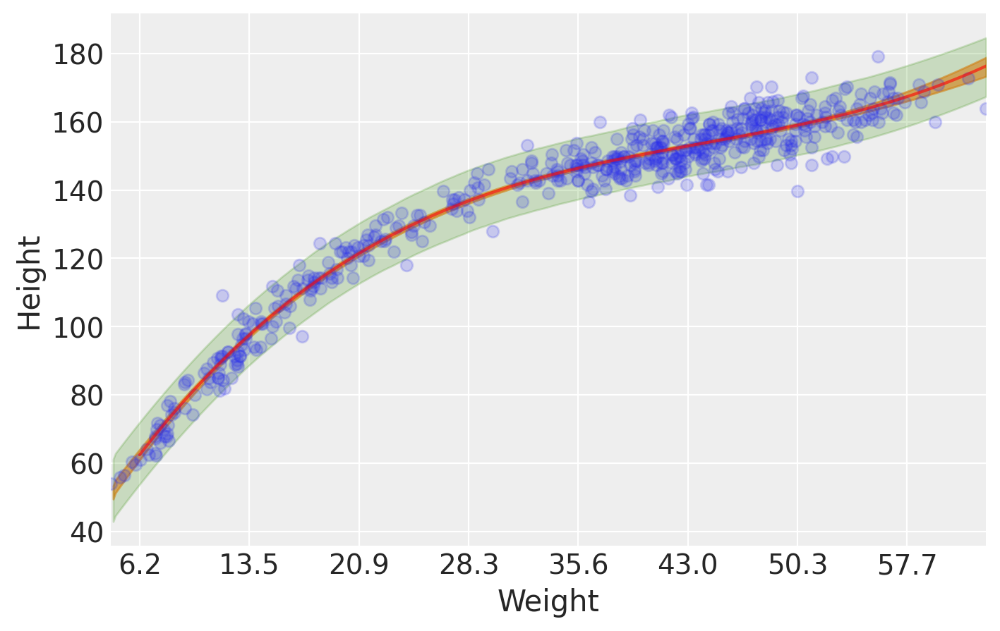

In [91]:
# calculate mean for quadratic curve
weight_seq = np.arange(-2, 2, 0.01)
height_seq = trace_4_6["a"].mean() + trace_4_6["b1"].mean()*weight_seq + trace_4_6["b2"].mean()*weight_seq**2 + trace_4_6["b3"].mean()*weight_seq**3

# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(d.weight_std, d.height, 'o', alpha=0.2)
# mean
plt.plot(weight_seq, height_seq, "r", alpha=0.6)
# CI for mean
az.plot_hpd(d.weight_std, mu_pred, color='C1', fill_kwargs={'alpha': 0.6})
# CI for height
az.plot_hpd(d.weight_std, height_pred["height"], color='C2', fill_kwargs={'alpha': 0.2})
plt.ylabel('Height', fontsize=15)
plt.xlabel('Weight', fontsize=15)
plt.xlim(d.weight_std.min(), d.weight_std.max())
at = np.arange(-2, 2, 0.5)
plt.xticks(at, np.round(at * d.weight.std() + d.weight.mean(), 1));
plt.show()

### 4.5.2. Splines

### Code 4.72

In [92]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hpd_3%,hpd_97%
year,1533.395,291.123,1016.00,1978.00
doy,104.921,6.258,92.00,115.00
temp,6.100,0.683,4.80,7.32
temp_upper,6.938,0.812,5.56,8.40
temp_lower,5.264,0.762,3.75,6.83


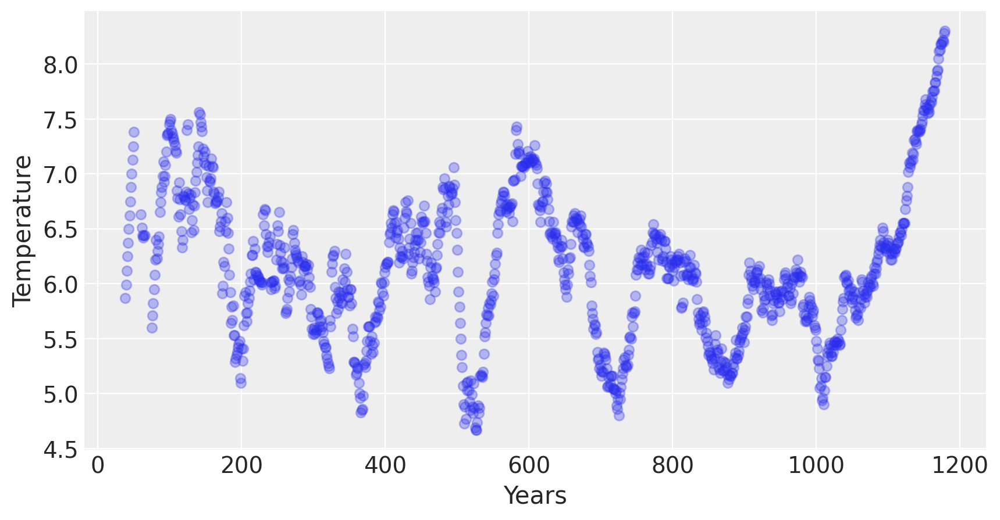

In [93]:
# plot results
fig = plt.figure(figsize=(10, 5))
plt.plot(d.temp, 'o', alpha=0.3)
plt.ylabel('Temperature', fontsize=15)
plt.xlabel('Years', fontsize=15)
plt.show()

### Code 4.73

In [94]:
d2 = d.dropna(subset=["temp"])
num_knots = 15
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

### Code 4.74

Here we will use ```patsy``` as a simple way of building the b-spline matrix. For more detail please read https://patsy.readthedocs.io/en/latest/spline-regression.html

In [95]:
# Each row is a year, 
# Each column is a basis function, 
# one of our synthetic variables defining a span of years 
# within which a corresponding parameter will influence prediction.

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

### Code 4.75

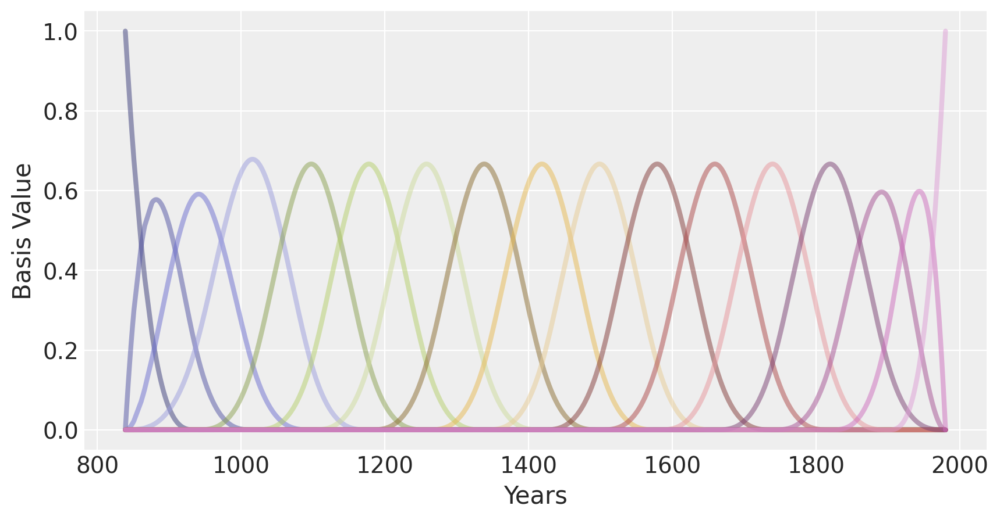

In [96]:
# plot results
fig = plt.figure(figsize=(10, 5))
cmap = plt.cm.get_cmap('tab20b', 17)
for n in range(np.shape(B)[1]):
    plt.plot(d2.year, (B[:, n]), linewidth=3, color=cmap(n), alpha=0.5)
plt.ylabel('Basis Value', fontsize=15)
plt.xlabel('Years', fontsize=15)
plt.show()

### Code 4.76

Note: if the mode gets stall instead of sampling try replacing ```mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))``` with ```mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T)```

In [97]:
with pm.Model() as m4_7:
    a = pm.Normal('a', mu=6, sigma=10)
    w = pm.Normal("w", mu=0, sigma=1, shape=B.shape[1])
    sigma = pm.Exponential("sigma", 1)
    #mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
    mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    T = pm.Normal("T", mu, sigma, observed=d2.temp)
    trace_m4_7 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, w, a]
Sampling 4 chains, 0 divergences: 100%|██████████| 8000/8000 [00:18<00:00, 425.39draws/s]
The number of effective samples is smaller than 25% for some parameters.


### Code 4.77

In [98]:
wp = trace_m4_7[w].mean(0)

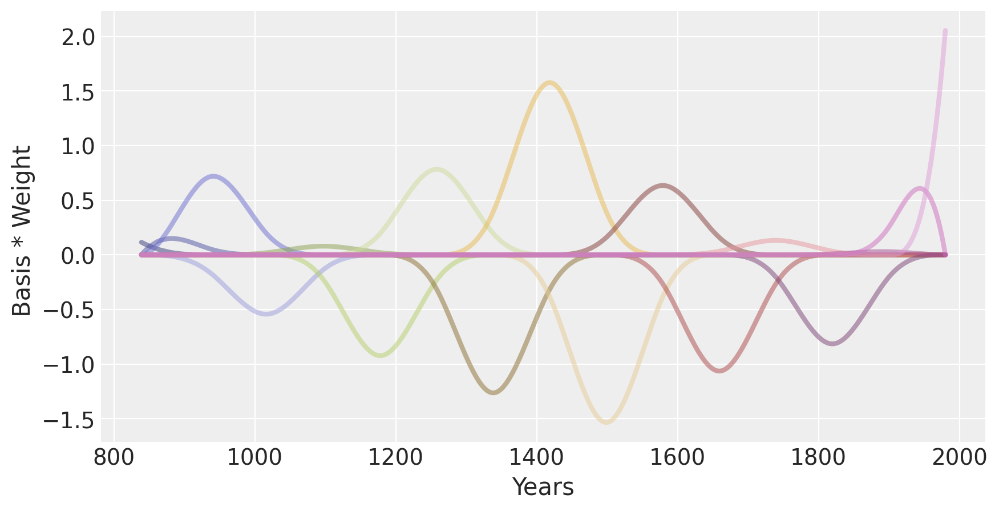

In [99]:
# plot results
fig = plt.figure(figsize=(10, 5))
cmap = plt.cm.get_cmap('tab20b', 17)
for n in range(np.shape(B)[1]):
    plt.plot(d2.year, (wp[n]*B[:, n]), linewidth=3, color=cmap(n), alpha=0.5)
plt.ylabel('Basis * Weight ', fontsize=15)
plt.xlabel('Years', fontsize=15)
plt.show()

### Code 4.77

In [100]:
up = np.zeros(len(B))
down = np.zeros(len(B))
for n in range(len(B)):
    down[n],up[n] = np.percentile(trace_m4_7["mu"][:,n], [5.5, 94.5])

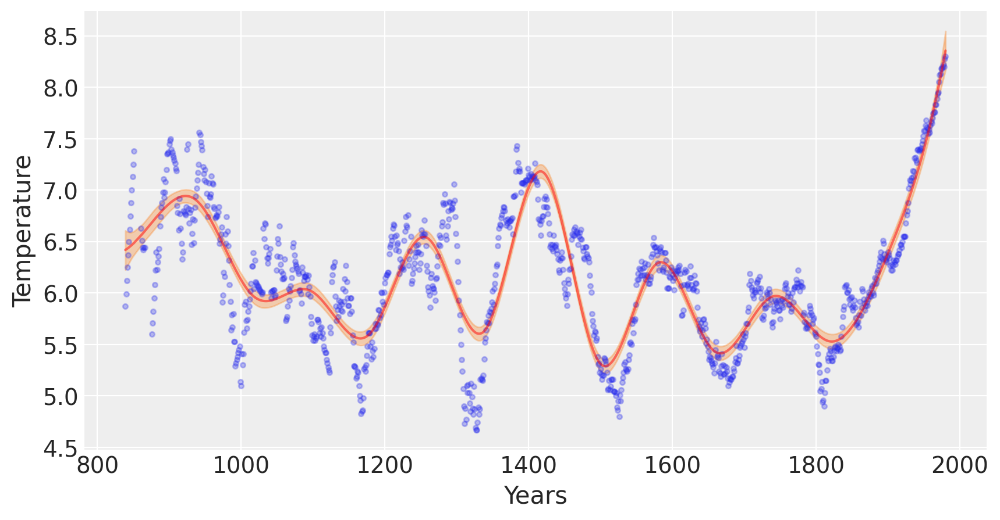

In [101]:
# plot results
fig = plt.figure(figsize=(10, 5))
plt.plot(d2.year, d2.temp, '.', alpha=0.3)
plt.plot(d2.year, trace_m4_7["mu"].mean(0), "r", alpha=0.5)
#az.plot_hpd(d2.year, trace_m4_7["mu"], credible_interval=0.97, color='C1', fill_kwargs={'alpha': 0.2}) 
plt.fill_between(d2.year, up, down, color = 'C1', alpha=0.3)
plt.ylabel('Temperature', fontsize=15)
plt.xlabel('Years', fontsize=15)
plt.show()

### Code 4.78

See **Code 4.74**

### Reference


[pymc-devs: Chp04](https://github.com/pymc-devs/resources/blob/master/Rethinking_2/Chp_04.ipynb)